## Imports

In [54]:
import mne
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from mne.time_frequency import psd_array_welch
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
from matplotlib import colors
from typing import List, Optional, Tuple, Dict
from hampel import hampel
from matplotlib import rcParams
rcParams.update({'figure.dpi': 150})

# Set plotting style
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (15, 8)
plt.rcParams['font.size'] = 10

print("Libraries imported successfully!")
print(f"MNE version: {mne.__version__}")

Libraries imported successfully!
MNE version: 1.10.2


## Functions

### EEG Loader

In [55]:
def load_eeg_data(patient: str, dbs_freq: int, base_path: str) -> tuple:
    # Function to load EEG data based on patient ID, DBS frequency, and sleep state
    # Placeholder implementation
    file_path_sleep = f"{base_path}/{patient}/{patient}SLEEP{dbs_freq}.EDF"
    file_path_awake = f"{base_path}/{patient}/{patient}AWAKE{dbs_freq}.EDF"
    raw_sleep = mne.io.read_raw_edf(file_path_sleep, preload=True, verbose=False)
    raw_awake = mne.io.read_raw_edf(file_path_awake, preload=True, verbose=False)
    return raw_sleep, raw_awake

### Print EEG info

In [56]:
def print_eeg_info(raw):
    print("\n" + "="*60)
    print(f"EEG DATA INFORMATION FOR {raw.info['subject_info']['his_id']}")
    print("="*60)
    print(raw.info)
    print("\nCHANNELS:")
    print(raw.ch_names)
    print("\nDATA DURATION:")
    print(f"{raw.times[-1] / 60:.2f} minutes ({raw.times[-1] / 3600:.2f} hours)")
    print("\nSAMPLING FREQUENCY:")
    print(f"{raw.info['sfreq']} Hz")
    print("\nNUMBER OF CHANNELS:")
    print(f"{len(raw.ch_names)} channels")

### Set custom channels types

In [57]:
def set_custom_channel_types(raw_object):
    """
    Sets channel types for an MNE Raw object based on custom naming conventions.

    This function categorizes channels as 'eeg', 'emg', 'ecg', or 'misc'
    and modifies the Raw object in-place.

    Parameters
    ----------
    raw_object : mne.io.Raw
        The MNE Raw object to be modified.
    """
    # Define the standard 10-20 EEG channel names
    eeg_10_20 = {
        'Fp1', 'F7', 'T3', 'T5', 'O1', 'F3', 'C3', 'P3', 'Fz', 'Cz', 'Fp2',
        'F8', 'T4', 'T6', 'O2', 'F4', 'C4', 'P4', 'Pz',
        'A1', 'A2'
    } # Using a set for faster lookups
    
    ext_eeg = {'T1', 'T2', 'Fpz'}

    # Use a dictionary comprehension for a more concise approach
    ch_types = {
        ch: 'eeg' if ch in eeg_10_20
        else 'eeg' if ch in ext_eeg
        else 'emg' if ch.startswith('EMG')
        else 'ecg' if ch.startswith('EKG')
        else 'eog' if ch.startswith('LOC') or ch.startswith('ROC')
        else 'misc'
        for ch in raw_object.ch_names
    }

    raw_object.set_channel_types(ch_types)
    print(f"Channel types set for {len(raw_object.ch_names)} channels.")

### set reference

In [58]:
def set_reference(raw_object, ref_channels: list or str = 'average'):
    """
    Sets the reference for an MNE Raw object.

    This function applies a common average reference or a specified reference
    channel to the Raw object in-place.

    Parameters
    ----------
    raw_object : mne.io.Raw
        The MNE Raw object to be modified.
    ref_channels : list or str
        List of channel names to use as reference or 'average' for common average reference.
    """
    raw_object.set_eeg_reference(ref_channels=ref_channels)
    print(f"Reference set using channels: {ref_channels}")

In [59]:
def plot_timeseries(raw: mne.io.Raw,
                           picks: Optional[List[str]] = None,
                           start: float = 0,
                           duration: float = 10,
                           title: Optional[str] = None,
                           figsize: Tuple[float, float] = (15, 10),
                           show: bool = True):
    """
    Generates a high-quality, customizable time series plot and returns the figure.

    Defaults to plotting all EEG channels if no 'picks' are provided.
    Allows for custom figure size.

    Parameters
    ----------
    raw : mne.io.Raw
        The MNE Raw object containing the data.
    picks : list of str, optional
        A specific list of channel names to plot. If None, all 'eeg' channels
        are plotted automatically. Defaults to None.
    start : float, optional
        Start time in seconds for the plot. Defaults to 0.
    duration : float, optional
        Duration of the time window to plot in seconds. Defaults to 10.
    title : str, optional
        Custom title for the plot. If None, a descriptive title is automatically generated.
    figsize : tuple, optional
        The figure size (width, height) in inches. Defaults to (15, 10).
    show : bool, optional
        If True, the plot is displayed automatically. Defaults to True.

    Returns
    -------
    matplotlib.figure.Figure
        The Matplotlib figure object for saving or further modification.
    """
    # --- Flexible Channel Selection ---
    if picks is None:
        # Default mode: Automatically find all EEG channels
        channel_picks = mne.pick_types(raw.info, eeg=True, exclude='bads')
        plot_mode = 'EEG'
        scalings = dict(eeg=50e-6) # Sensible default scaling for EEG
    else:
        # Manual mode: Use the provided list of channel names
        channel_picks = picks
        plot_mode = 'Custom'
        scalings = 'auto' # Auto-scale when channel types might be mixed

    if len(channel_picks) == 0:
        print(f"Warning: No channels found to plot for mode '{plot_mode}'. Aborting.")
        return None

    # --- Aesthetics for a Nicer Plot ---
    plt.style.use('seaborn-v0_8-whitegrid')
    channel_color = dict(all='darkslateblue')

    # --- Smart Title Generation ---
    if title is None:
        title = f"{plot_mode} Channels ({len(channel_picks)} selected) from {start:.1f}s to {start + duration:.1f}s"

    # --- Generate the Plot ---
    fig = raw.plot(
        picks=channel_picks,
        start=start,
        duration=duration,
        title=title,
        scalings=scalings,
        color=channel_color,
        show=False, # Must be False to allow for customization before showing
        n_channels=len(channel_picks)
    )

    # --- Apply Customizations ---
    fig.set_size_inches(figsize) # Set the custom figure size
    fig.set_facecolor('white')   # Ensure a clean white background
    plt.tight_layout()           # Adjust layout to prevent labels from overlapping

    if show:
        plt.show()

    return fig

In [60]:
def set_eeg_montage(raw_object, montage_name: str = 'standard_1020'):
    """
    Sets the EEG montage for an MNE Raw object.

    This function applies a standard EEG montage to the Raw object in-place.

    Parameters
    ----------
    raw_object : mne.io.Raw
        The MNE Raw object to be modified.
    montage_name : str
        Name of the standard montage to apply. Defaults to 'standard_1020'.
    """
    try:
        montage = mne.channels.make_standard_montage('standard_1020')
        raw_object.set_montage(montage, on_missing='warn')
        print("Montage set successfully!")
    except Exception as e:
        print(f"Error setting montage: {e}")

In [61]:
def apply_frequency_filter(raw: mne.io.Raw,
                       l_freq: Optional[float] = None,
                       h_freq: Optional[float] = None,
                       filter_length: str = 'auto',
                       powerline_freq: Optional[float] = None,
                       fir_design: str = 'firwin') -> mne.io.Raw:
    """
    Apply a classic DSP filter to the EEG data.

    Parameters
    ----------
    raw : mne.io.Raw
        The MNE Raw object containing the EEG data.
    l_freq : float | None
        The lower frequency bound for the filter (in Hz).
    h_freq : float | None
        The upper frequency bound for the filter (in Hz).
    filter_length : str
        The length of the filter (e.g., 'auto', '10s', etc.).
    fir_design : str
        The design method for the FIR filter (e.g., 'firwin', 'firls', etc.).

    Returns
    -------
    mne.io.Raw
        The filtered MNE Raw object.
    """
    # Apply the filter
    raw.filter(l_freq=l_freq, h_freq=h_freq, fir_design=fir_design)
    # Remove power line noise (it can be 50-60Hz depending on region)
    if powerline_freq is not None:
        raw.notch_filter(freqs=powerline_freq, fir_design=fir_design)
    print(f"Applied bandpass filter: {l_freq} - {h_freq} Hz")

In [62]:
def plot_channel_comparison(raw1: mne.io.Raw,
                            start1: float,
                            raw2: mne.io.Raw,
                            start2: float,
                            channel_name: str,
                            duration: float = 5.0,
                            label1: str = 'Segment 1',
                            label2: str = 'Segment 2',
                            figsize: Tuple[float, float] = (15, 8)):
    """
    Compares two different time segments for a single channel on side-by-side subplots.

    The segments can be from the same or different Raw objects.

    Parameters
    ----------
    raw1 : mne.io.Raw
        The first MNE Raw object.
    start1 : float
        The start time (in seconds) of the first segment.
    raw2 : mne.io.Raw
        The second MNE Raw object. Can be the same as raw1.
    start2 : float
        The start time (in seconds) of the second segment.
    channel_name : str
        The name of the channel to plot (e.g., 'Cz').
    duration : float, optional
        The duration (in seconds) for both plot windows. Defaults to 5.0.
    label1 : str, optional
        The label/title for the first subplot. Defaults to 'Segment 1'.
    label2 : str, optional
        The label/title for the second subplot. Defaults to 'Segment 2'.
    figsize : tuple, optional
        The figure size (width, height) in inches. Defaults to (15, 8).

    Returns
    -------
    matplotlib.figure.Figure
        The Matplotlib figure object containing the plots.
    """
    # --- Validate that the channel exists in both objects ---
    if channel_name not in raw1.ch_names or channel_name not in raw2.ch_names:
        print(f"Error: Channel '{channel_name}' must exist in both Raw objects.")
        return None

    # --- Prepare data for the first segment ---
    start_samp1, stop_samp1 = raw1.time_as_index([start1, start1 + duration])
    times1 = raw1.times[start_samp1:stop_samp1]
    data1 = raw1.get_data(picks=[channel_name], start=start_samp1, stop=stop_samp1)[0] * 1e6 # Convert to µV

    # --- Prepare data for the second segment ---
    start_samp2, stop_samp2 = raw2.time_as_index([start2, start2 + duration])
    times2 = raw2.times[start_samp2:stop_samp2]
    data2 = raw2.get_data(picks=[channel_name], start=start_samp2, stop=stop_samp2)[0] * 1e6 # Convert to µV

    # --- Create the Plot ---
    plt.style.use('seaborn-v0_8-whitegrid')
    # Use sharey=True for direct amplitude comparison
    fig, axes = plt.subplots(2, 1, figsize=figsize, sharey=True)
    fig.suptitle(f'Comparison for Channel: {channel_name}', fontsize=16, fontweight='bold')

    # Plot Segment 1
    axes[0].plot(times1, data1, color='cornflowerblue', linewidth=0.8)
    axes[0].set_title(label1, fontsize=14)
    axes[0].set_ylabel('Amplitude (µV)')
    axes[0].grid(True, which='both', linestyle='--', linewidth=0.5)

    # Plot Segment 2
    axes[1].plot(times2, data2, color='indianred', linewidth=0.8)
    axes[1].set_title(label2, fontsize=14)
    axes[1].set_xlabel('Time (s)')
    axes[1].set_ylabel('Amplitude (µV)')
    axes[1].grid(True, which='both', linestyle='--', linewidth=0.5)

    plt.tight_layout(rect=[0, 0, 1, 0.96]) # Adjust layout for the main title
    plt.show()

    return fig

In [63]:
def plot_psd_comparison(freqs_up: np.ndarray,
                        psd_up: np.ndarray,
                        channel_name: str,
                        freqs_down: Optional[np.ndarray] = None,
                        psd_down: Optional[np.ndarray] = None,
                        artifact_freqs: Optional[List[float]] = None,
                        fmin: float = 0.0,
                        fmax: float = 100.0,
                        title: Optional[str] = None,
                        subtitle_up: Optional[str] = None,
                        subtitle_down: Optional[str] = None,
                        figsize: Tuple[float, float] = (15, 10)):
    """
    Compares the Power Spectral Density (PSD) of two different datasets for a single channel.
    """
    plt.style.use('seaborn-v0_8-whitegrid')
    if freqs_down is None or psd_down is None:
        fig = plt.figure(figsize=figsize)
        fig.suptitle(rf"{title}" if title else f'PSD Plot for Channel: {channel_name}', fontsize=16, fontweight='bold')
        plt.semilogy(freqs_up, psd_up, color='cornflowerblue', linewidth=1.5, label='PSD')
        plt.title(subtitle_up if subtitle_up else 'PSD Plot', fontsize=14)
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('Power (µV²/Hz)')
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)
        if artifact_freqs:
            colors = ['red', 'orange', 'purple']
            for i, freq in enumerate(artifact_freqs):
                label = f'{freq} Hz Artifact'
                plt.axvline(freq, color=colors[i % len(colors)], linestyle='--',
                            linewidth=1.5, label=label, alpha=0.7)
            plt.legend(loc='upper right')
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()
        return fig
    
    
    fig, axes = plt.subplots(2, 1, figsize=figsize, sharex=True, sharey=True)
    fig.suptitle(rf"{title}" if title else f'PSD Comparison for Channel: {channel_name}', fontsize=16, fontweight='bold')

    # --- Plot Up Data PSD ---
    axes[0].semilogy(freqs_up, psd_up, color='cornflowerblue', linewidth=1.5, label='Raw PSD')
    axes[0].set_title(rf"{subtitle_up}", fontsize=14)
    axes[0].set_ylabel('Power (µV²/Hz)')
    axes[0].grid(True, which='both', linestyle='--', linewidth=0.5)

    # --- Plot Down Data PSD ---
    axes[1].semilogy(freqs_down, psd_down, color='forestgreen', linewidth=1.5, label='Filtered PSD')
    axes[1].set_title(rf"{subtitle_down}", fontsize=14)
    axes[1].set_xlabel('Frequency (Hz)')
    axes[1].set_ylabel('Power (µV²/Hz)')
    axes[1].grid(True, which='both', linestyle='--', linewidth=0.5)

    # --- Add Artifact Lines to Both Plots ---
    colors = ['red', 'orange', 'purple']
    if artifact_freqs:
        for i, freq in enumerate(artifact_freqs):
            # Add line to raw plot with a clear label
            label = f'{freq} Hz Artifact'
            axes[0].axvline(freq, color=colors[i % len(colors)], linestyle='--',
                            linewidth=1.5, label=label, alpha=0.7)
            # Add matching line to filtered plot (without label) for reference
            axes[1].axvline(freq, color=colors[i % len(colors)], linestyle='--',
                            linewidth=1.5, alpha=0.5)

    # Add legends after all lines have been added
    axes[0].legend(loc='upper right')
    axes[1].legend(loc='upper right')

    # --- Apply Final Settings ---
    # Set the custom frequency range on the x-axis
    axes[1].set_xlim(fmin, fmax)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    return fig

#### Plot band power topomaps

In [64]:
def plot_band_power_topomaps(raw_object: mne.io.Raw,
                             band_powers: Dict[str, np.ndarray],
                             suptitle: str = "Topographic Distribution of Band Powers",
                             save_path: Optional[str] = None):
    """
    Plots the topographic distribution of power for different frequency bands.

    If channels with standard 10-20 positions are not found, it automatically
    creates fallback bar plots instead.

    Parameters
    ----------
    raw_object : mne.io.Raw
        The MNE Raw object, used for channel information.
    band_powers : dict
        A dictionary where keys are band names (e.g., 'Alpha') and values are
        NumPy arrays of the power for each channel.
    suptitle : str, optional
        The main title for the entire figure.
    save_path : str, optional
        The file path to save the figure. If None, the figure is not saved.
        Example: 'my_figure.png'.

    Returns
    -------
    matplotlib.figure.Figure
        The Matplotlib figure object created.
    """
    try:
        # --- Attempt to Create Topographic Plots ---
        montage = mne.channels.make_standard_montage('standard_1020')
        standard_channels = set(montage.ch_names)

        # Find channels in the data that have a standard 10-20 position
        available_channels = [ch for ch in raw_object.ch_names if ch in standard_channels]

        if not available_channels:
            raise ValueError("No channels with standard 10-20 positions were found.")

        print(f"Found {len(available_channels)} channels with standard positions for plotting.")

        # Create a temporary Raw object with only these channels and set the montage
        raw_temp = raw_object.copy().pick(available_channels)
        raw_temp.set_montage(montage, on_missing='warn')

        # Get the indices of these channels from the original Raw object
        ch_indices = [raw_object.ch_names.index(ch) for ch in available_channels]

        # Filter the band_powers dictionary to only include these channels
        topo_band_powers = {band: powers[ch_indices] for band, powers in band_powers.items()}

        # --- Plotting ---
        fig, axes = plt.subplots(2, 3, figsize=(18, 10))
        axes = axes.flatten()

        for idx, (band_name, powers) in enumerate(topo_band_powers.items()):
            im, _ = mne.viz.plot_topomap(powers, raw_temp.info, axes=axes[idx], show=False,
                                         cmap='viridis', contours=6)
            axes[idx].set_title(band_name, fontsize=14, fontweight='bold')
            cbar = plt.colorbar(im, ax=axes[idx], fraction=0.046, pad=0.04)
            cbar.set_label('Power (µV²)', rotation=270, labelpad=15)

        # Clean up unused subplot if necessary
        if len(band_powers) < len(axes):
            for i in range(len(band_powers), len(axes)):
                fig.delaxes(axes[i])

        fig.suptitle(suptitle, fontsize=18, fontweight='bold')
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])


    except Exception as e:
        # --- Fallback to Bar Plots ---
        print(f"\nCould not create topographic plots: {e}")
        print("Creating alternative bar plots instead...")

        fig, axes = plt.subplots(2, 3, figsize=(18, 10))
        axes = axes.flatten()

        for idx, (band_name, powers) in enumerate(band_powers.items()):
            axes[idx].bar(raw_object.ch_names, powers)
            axes[idx].set_title(band_name, fontsize=14, fontweight='bold')
            axes[idx].set_ylabel('Band Power (µV²)')
            axes[idx].grid(True, axis='y', alpha=0.5)
            plt.setp(axes[idx].get_xticklabels(), rotation=90, ha='right')

        if len(band_powers) < len(axes):
            for i in range(len(band_powers), len(axes)):
                fig.delaxes(axes[i])

        fig.suptitle(f"{suptitle} (Bar Plot Fallback)", fontsize=18, fontweight='bold')
        plt.tight_layout()

    # --- Save and Show ---
    if save_path:
        print(f"Saving figure to {save_path}...")
        plt.savefig(save_path, dpi=300)
    plt.show()

    return fig

#### get PSD

In [65]:
def get_psd(raw: mne.io.Raw,
            fmin: float = 0.5,
            fmax: float = 40.0,
            n_fft: int = 2048,
            n_overlap: int = 512,
            n_per_seg: int = 1024) -> tuple:
    """
    Compute the Power Spectral Density (PSD) of EEG data using Welch's method.

    Parameters
    ----------
    raw : mne.io.Raw
        The MNE Raw object containing the EEG data.
    fmin : float
        Minimum frequency of interest (in Hz).
    fmax : float
        Maximum frequency of interest (in Hz).
    n_fft : int
        Length of the FFT used.
    n_overlap : int
        Number of points to overlap between segments.
    n_per_seg : int
        Length of each segment.

    Returns
    -------
    tuple
        Frequencies and corresponding PSD values.
    """
    picks = mne.pick_types(raw.info, eeg=True, exclude='bads')
    data, times = raw[picks, :]
    psds, freqs = psd_array_welch(data, sfreq=raw.info['sfreq'], fmin=fmin, fmax=fmax,
                                  n_fft=n_fft, n_overlap=n_overlap, n_per_seg=n_per_seg)
    return freqs, psds

#### calculate band powers

In [66]:
def calculate_band_powers(psd: np.ndarray,
                          freqs: np.ndarray,
                          ch_names: List[str],
                          bands: Optional[Dict[str, Tuple[float, float]]] = None) -> pd.DataFrame:
    """
    Calculates the power for specified frequency bands from PSD data.

    Parameters
    ----------
    psd : np.ndarray
        The Power Spectral Density data, with shape (n_channels, n_freqs).
    freqs : np.ndarray
        The frequency bins corresponding to the PSD data.
    ch_names : list of str
        A list of channel names that MUST match the channels in the psd array.
    bands : dict, optional
        A dictionary defining the frequency bands. If None, default EEG bands
        are used.

    Returns
    -------
    pd.DataFrame
        A DataFrame containing the band power for each channel and band.
    """
    # --- Robustness Check ---
    # Ensure the number of channels in the PSD array matches the number of channel names
    if psd.shape[0] != len(ch_names):
        raise ValueError(
            f"Mismatch in dimensions: PSD has data for {psd.shape[0]} channels, "
            f"but {len(ch_names)} channel names were provided."
        )

    # Use default EEG bands if none are provided
    if bands is None:
        bands = {
            'Delta (0.5-4 Hz)': (0.5, 4), 'Theta (4-8 Hz)': (4, 8),
            'Alpha (8-13 Hz)': (8, 13), 'Beta (13-30 Hz)': (13, 30),
            'Gamma (30-40 Hz)': (30, 40)
        }

    band_powers = {}
    for band, (fmin, fmax) in bands.items():
        freq_indices = np.where((freqs >= fmin) & (freqs <= fmax))[0]
        # Use dx=np.diff(freqs)[0] for a more robust integration step
        band_powers[band] = np.trapz(psd[:, freq_indices], dx=np.diff(freqs)[0], axis=1)

    band_power_df = pd.DataFrame(band_powers, index=ch_names)
    band_power_df.index.name = 'Channel'
    return band_power_df

### figures saving

In [67]:
def save_matplotlib_fig(fig, fname, dpi=300):
    """Robust save for matplotlib/MNE figures."""
    try:
        if hasattr(fig, 'savefig'):
            fig.savefig(fname, dpi=dpi, bbox_inches='tight')
        else:
            plt.gcf().savefig(fname, dpi=dpi, bbox_inches='tight')
    except Exception as e:
        print(f"Warning: could not save via fig.savefig(): {e}. Trying plt.savefig()")
        plt.savefig(fname, dpi=dpi, bbox_inches='tight')
    finally:
        plt.close('all')
    print(f"Saved: {fname}")


def save_psd_raw_vs_filtered(freqs_raw, psd_raw, freqs_filt, psd_filt, ch_idx, channel_name='Cz',
                             fname='psd_raw_vs_filtered.png', max_freq = 45):
    plt.figure(figsize=(8,5))
    plt.semilogy(freqs_raw, psd_raw[ch_idx], label='Raw', alpha=0.6)
    plt.semilogy(freqs_filt, psd_filt[ch_idx], label='Filtered (0.5-40 Hz + Notch)', alpha=0.9)
    plt.title(f'Raw vs Filtered PSD — Channel {channel_name}')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('PSD (µV²/Hz)')
    plt.xlim(0, max_freq)
    plt.grid(True, which='both', linestyle='--', alpha=0.4)
    plt.legend()
    plt.tight_layout()
    plt.savefig(fname, dpi=300, bbox_inches='tight')
    plt.close()
    print(f"Saved: {fname}")


def save_psd_method_comparison(psd_freqs, psd_base, psd_zap, psd_spec, psd_hampel_freq, psd_hampel_time,
                               ch_idx, channel_name='Cz', fname='psd_method_comparison.png'):
    plt.figure(figsize=(10,6))
    plt.title(f'DBS Artifact Removal Comparison — Channel {channel_name}')
    plt.semilogy(psd_freqs, psd_base[ch_idx], label='Baseline (BP 0.5-40 Hz)', color='gray', alpha=0.5, linewidth=2)
    plt.semilogy(psd_freqs, psd_zap[ch_idx], label='Zapline', linewidth=1.5)
    plt.semilogy(psd_freqs, psd_spec[ch_idx], label='Spectrum-fit Notch', linewidth=1.5, linestyle='--')
    plt.semilogy(psd_freqs, psd_hampel_freq[ch_idx], label='Freq-domain Hampel', linewidth=1.5, linestyle='-.')
    plt.semilogy(psd_freqs, psd_hampel_time[ch_idx], label='Time-domain Hampel', linewidth=1.5, linestyle=':')
    # mark DBS fundamentals up to 45 Hz (optional)
    try:
        for freq in np.arange(dbs_freq, 45+1, dbs_freq):
            plt.axvline(freq, color='orange', linestyle=':', alpha=0.4)
    except Exception:
        pass
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('PSD (µV²/Hz)')
    plt.xlim(0, 45)
    plt.grid(True, which='both', linestyle='--', alpha=0.4)
    plt.legend()
    plt.tight_layout()
    plt.savefig(fname, dpi=300, bbox_inches='tight')
    plt.close()
    print(f"Saved: {fname}")


def save_topomap_panel(df_before, df_after, montage_info, bands_dict, fname='topomaps_before_after.png'):
    """
    df_before / df_after: DataFrames indexed by channel names with band columns matching bands_dict keys.
    montage_info: an MNE info object configured with standard montage and matching channels.
    bands_dict: Ordered mapping of band_name -> (fmin, fmax) used as columns in the dataframes.
    """
    n_bands = len(bands_dict)
    ncols = n_bands
    fig, axes = plt.subplots(2, ncols, figsize=(5*ncols, 8))
    fig.suptitle("Topographic Power: Before (top) vs After (bottom)", fontsize=16, fontweight='bold')
    for i, band in enumerate(bands_dict.keys()):
        vals_before = df_before[band].values
        vals_after = df_after[band].values
        vmax = max(df_before[band].max(), df_after[band].max())
        im, _ = mne.viz.plot_topomap(vals_before, montage_info, axes=axes[0, i], show=False,
                                     cmap='viridis', vlim=(0, vmax), contours=6)
        axes[0, i].set_title(f"Before: {band}", fontsize=11)
        im2, _ = mne.viz.plot_topomap(vals_after, montage_info, axes=axes[1, i], show=False,
                                      cmap='viridis', vlim=(0, vmax), contours=6)
        axes[1, i].set_title(f"After: {band}", fontsize=11)
        cbar = plt.colorbar(im2, ax=axes[:, i], fraction=0.05, pad=0.04, orientation='horizontal')
        cbar.set_label('Power (µV²)')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    fig.savefig(fname, dpi=300, bbox_inches='tight')
    plt.close()
    print(f"Saved: {fname}")


def save_time_domain_comparison(raw1, start1, raw2, start2, channel_name, duration, fname='time_domain_comparison.png'):
    fig = plot_channel_comparison(raw1, start1, raw2, start2, channel_name=channel_name, duration=duration, show=False)
    # plot_channel_comparison returns a fig; ensure saved
    try:
        save_matplotlib_fig(fig, fname)
    except Exception:
        # fallback: save current fig
        plt.savefig(fname, dpi=300, bbox_inches='tight')
        plt.close()
        print(f"Saved (fallback): {fname}")


def save_ica_overlay_and_bipolar(raw_pre_ica, raw_post_ica, ica_obj, fname_overlay='ica_overlay.png', fname_bipolar='bipolar_montage.png'):
    # 1) ICA overlay (use ica.plot_overlay which returns a figure-like object)
    try:
        fig_overlay = ica_obj.plot_overlay(raw_pre_ica, exclude=ica_obj.exclude, picks='eeg', show=False)
        save_matplotlib_fig(fig_overlay, fname_overlay)
    except Exception as e:
        print("ICA overlay save failed:", e)
    # 2) Bipolar montage (use your existing function)
    try:
        fig = plot_bipolar_montage(raw_post_ica, start=0, duration=10, title="Bipolar Montage (Cleaned)")
        save_matplotlib_fig(fig, fname_bipolar)
    except Exception as e:
        print("Bipolar montage save failed:", e)


## Execution

In [68]:
# start with XU 7 DBS
patient = "XU"
dbs_freq = 7  # in Hz
base_path = "../data"
powerline_freq = 60.0  # in Hz
raw_sleep, raw_awake = load_eeg_data(patient, dbs_freq, base_path)

In [69]:
print_eeg_info(raw_sleep)


EEG DATA INFORMATION FOR X
<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, F7, T3, T5, O1, F3, C3, P3, A1, Fz, Cz, Fp2, F8, T4, T6, ...
 chs: 46 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 128.0 Hz
 meas_date: 2025-05-11 00:22:15 UTC
 nchan: 46
 projs: []
 sfreq: 256.0 Hz
 subject_info: <subject_info | his_id: X, sex: 0, first_name: X, last_name: X>
>

CHANNELS:
['Fp1', 'F7', 'T3', 'T5', 'O1', 'F3', 'C3', 'P3', 'A1', 'Fz', 'Cz', 'Fp2', 'F8', 'T4', 'T6', 'O2', 'F4', 'C4', 'P4', 'A2', 'Fpz', 'Pz', 'T1', 'T2', 'EKGL', 'EKGR', 'LOC1', 'LOC2', 'EMG1', 'EMG2', 'X9', 'X10', 'X11', 'X12', 'X13', 'X14', 'X15', 'X16', 'X17', 'X18', 'DC1', 'DC2', 'DC3', 'DC4', 'OSAT', 'PR']

DATA DURATION:
10.63 minutes (0.18 hours)

SAMPLING FREQUENCY:
256.0 Hz

NUMBER OF CHANNELS:
46 channels


In [70]:
print_eeg_info(raw_awake)


EEG DATA INFORMATION FOR X
<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, F7, T3, T5, O1, F3, C3, P3, A1, Fz, Cz, Fp2, F8, T4, T6, ...
 chs: 46 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 128.0 Hz
 meas_date: 2025-05-10 18:55:25 UTC
 nchan: 46
 projs: []
 sfreq: 256.0 Hz
 subject_info: <subject_info | his_id: X, sex: 0, first_name: X, last_name: X>
>

CHANNELS:
['Fp1', 'F7', 'T3', 'T5', 'O1', 'F3', 'C3', 'P3', 'A1', 'Fz', 'Cz', 'Fp2', 'F8', 'T4', 'T6', 'O2', 'F4', 'C4', 'P4', 'A2', 'Fpz', 'Pz', 'T1', 'T2', 'EKGL', 'EKGR', 'LOC1', 'LOC2', 'EMG1', 'EMG2', 'X9', 'X10', 'X11', 'X12', 'X13', 'X14', 'X15', 'X16', 'X17', 'X18', 'DC1', 'DC2', 'DC3', 'DC4', 'OSAT', 'PR']

DATA DURATION:
9.47 minutes (0.16 hours)

SAMPLING FREQUENCY:
256.0 Hz

NUMBER OF CHANNELS:
46 channels


In [71]:
set_custom_channel_types(raw_sleep)
set_custom_channel_types(raw_awake)

Channel types set for 46 channels.
Channel types set for 46 channels.


In [72]:
set_eeg_montage(raw_sleep)
set_eeg_montage(raw_awake)

Montage set successfully!
Montage set successfully!


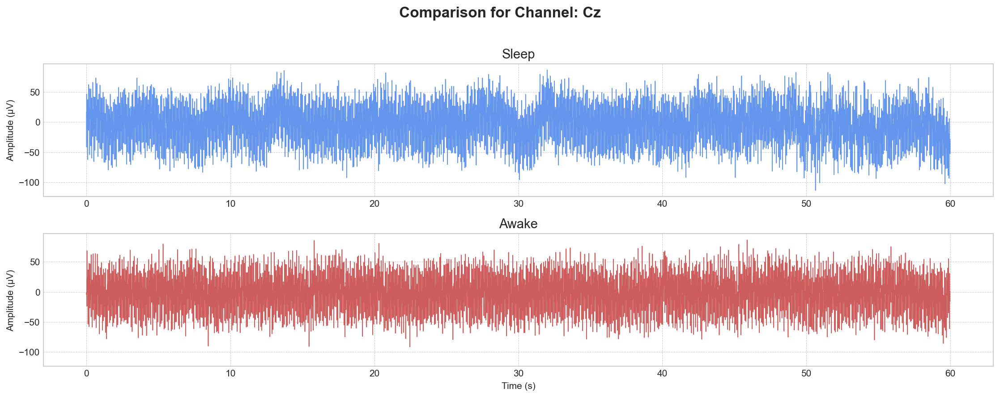

In [73]:
fig_xu7_sleep = plot_channel_comparison(raw_sleep, raw2=raw_awake, start1=0, start2=0, channel_name='Cz', duration=60.0, label1='Sleep', label2='Awake', figsize=(15, 6))

In [74]:
psd_base_sleep_freqs, psd_base_sleep = get_psd(raw_sleep, fmax=128.0)
psd_base_awake_freqs, psd_base_awake = get_psd(raw_awake, fmax=128.0)

Effective window size : 8.000 (s)


Effective window size : 8.000 (s)


In [75]:
artifact_freqs = [dbs_freq * n for n in range(1, 10)]  # e.g., [7, 14, 21, 28, 35]

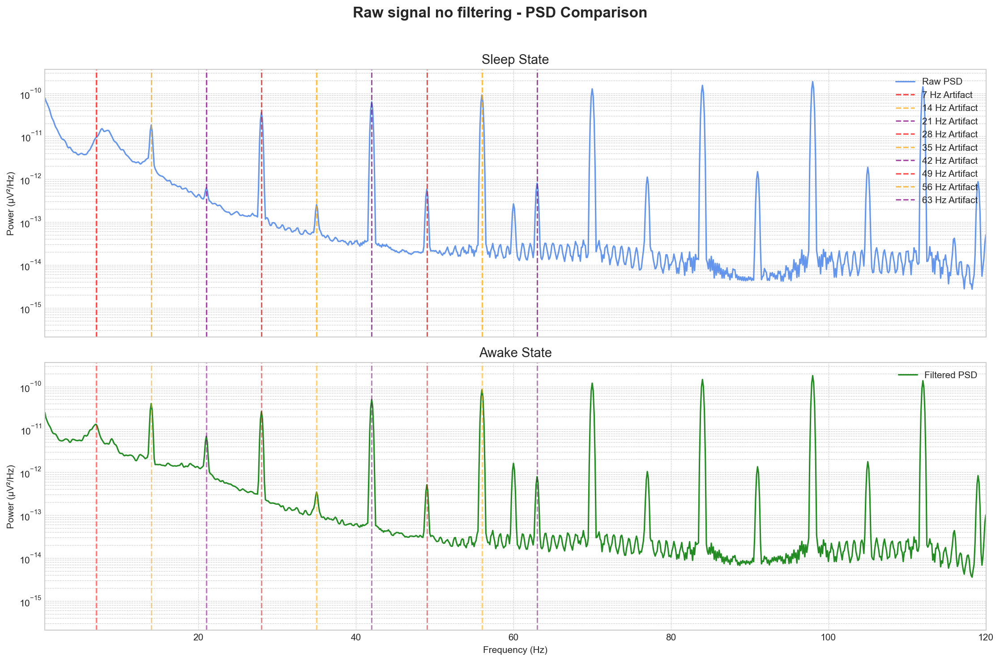

In [76]:
psd_comparison = plot_psd_comparison(
    freqs_up=psd_base_sleep_freqs,
    psd_up=psd_base_sleep[raw_sleep.ch_names.index('Cz')],
    freqs_down=psd_base_awake_freqs,
    psd_down=psd_base_awake[raw_awake.ch_names.index('Cz')],
    channel_name='Cz',
    fmin=0.5,
    fmax=120.0,
    title='Raw signal no filtering - PSD Comparison',
    subtitle_up='Sleep State',
    subtitle_down='Awake State',
    artifact_freqs=artifact_freqs
)

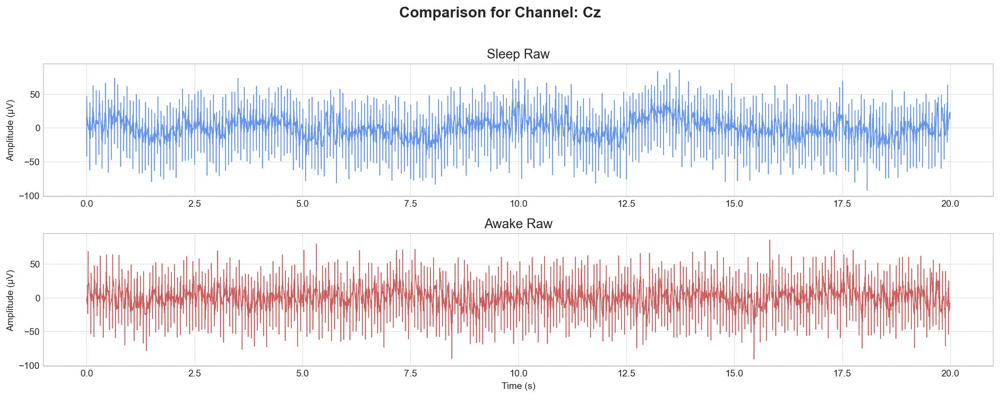

In [77]:
# plot time domain before filtering
fig_xu7_sleep_raw = plot_channel_comparison(raw1=raw_sleep, start1=0,
                                            raw2=raw_awake, start2=0,
                                            channel_name='Cz',
                                            duration=20.0,
                                            label1='Sleep Raw',
                                            label2='Awake Raw',
                                            figsize=(15, 6))

### Apply bandpass filtering and notch on powerline frequency

In [78]:
filtered_sleep = raw_sleep.copy()
apply_frequency_filter(filtered_sleep, l_freq=0.5, h_freq=40.0, powerline_freq=60.0)
filtered_awake = raw_awake.copy()
apply_frequency_filter(filtered_awake, l_freq=0.5, h_freq=40.0, powerline_freq=60.0)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1691 samples (6.605 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 59.35
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 59.10 Hz)
- Upper passband e

In [79]:
psd_filt_sleep_freqs, psd_filt_sleep = get_psd(filtered_sleep, fmax=128.0)
psd_filt_awake_freqs, psd_filt_awake = get_psd(filtered_awake, fmax=128.0)

Effective window size : 8.000 (s)
Effective window size : 8.000 (s)


In [80]:
artifact_freqs.append(60)

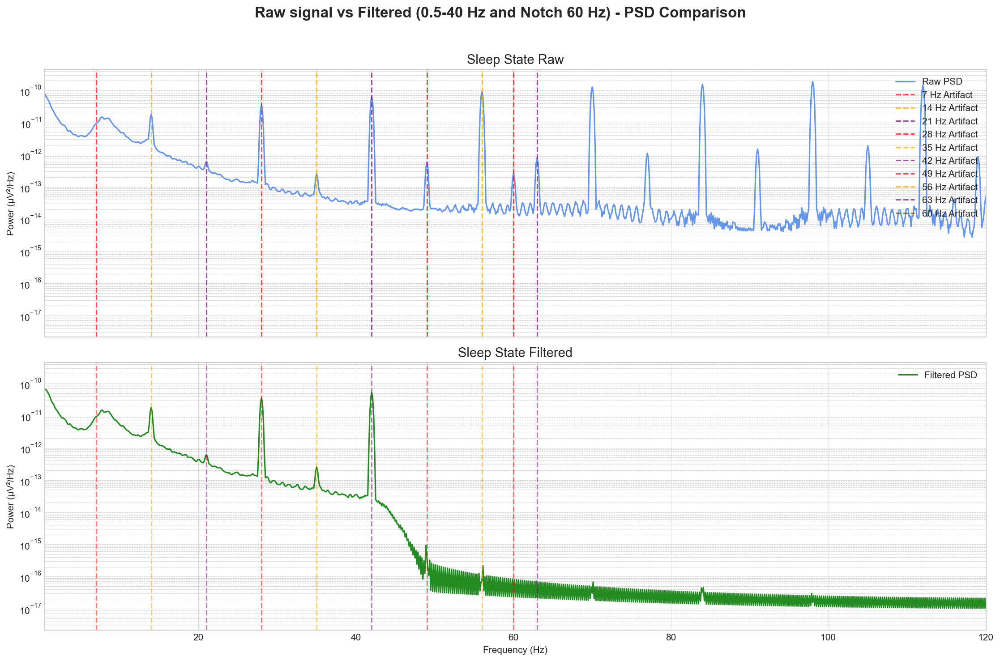

In [81]:
psd_filt_comparison = plot_psd_comparison(
    freqs_up=psd_base_sleep_freqs,
    psd_up=psd_base_sleep[raw_sleep.ch_names.index('Cz')],
    freqs_down=psd_filt_sleep_freqs,
    psd_down=psd_filt_sleep[filtered_sleep.ch_names.index('Cz')],
    channel_name='Cz',
    fmin=0.5,
    fmax=120.0,
    title='Raw signal vs Filtered (0.5-40 Hz and Notch 60 Hz) - PSD Comparison',
    subtitle_up='Sleep State Raw',
    subtitle_down='Sleep State Filtered',
    artifact_freqs=artifact_freqs
)

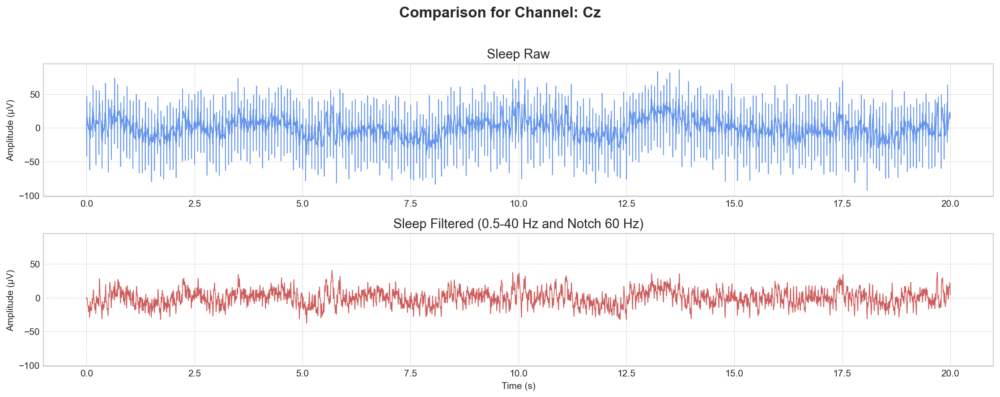

In [82]:
# plot time domain comparsion before and after filtering
fig_xu7_sleep_filt = plot_channel_comparison(raw1=raw_sleep, start1=0,
                                             raw2=filtered_sleep, start2=0,
                                             channel_name='Cz',
                                             duration=20.0,
                                             label1='Sleep Raw',
                                             label2='Sleep Filtered (0.5-40 Hz and Notch 60 Hz)',
                                             figsize=(15, 6))

### DBS artifact removal

In [83]:
from mne_denoise import apply_zapline_to_raw

In [84]:
filtered_dbs_removed_sleep, scores, details, freqs = apply_zapline_to_raw(filtered_sleep, line_freqs=dbs_freq, verbose=False)

Data set is short. Adjusted window size for whole-spectrum calculation to 79.0 seconds.


In [85]:
psd_dbs_removed_freqs, psd_dbs_removed = get_psd(filtered_dbs_removed_sleep, fmax=128.0)

Effective window size : 8.000 (s)


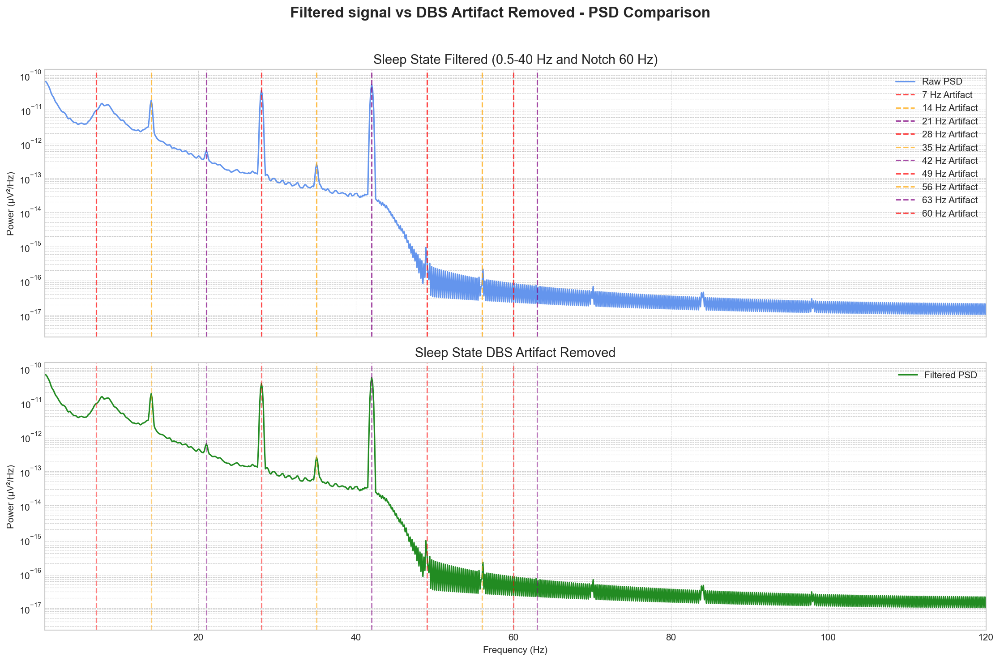

In [86]:
psd_plot_dbs_removed = plot_psd_comparison(
    freqs_up=psd_filt_sleep_freqs,
    psd_up=psd_filt_sleep[filtered_sleep.ch_names.index('Cz')],
    freqs_down=psd_dbs_removed_freqs,
    psd_down=psd_dbs_removed[filtered_dbs_removed_sleep.ch_names.index('Cz')],
    channel_name='Cz',
    fmin=0.5,
    fmax=120.0,
    title='Filtered signal vs DBS Artifact Removed - PSD Comparison',
    subtitle_up='Sleep State Filtered (0.5-40 Hz and Notch 60 Hz)',
    subtitle_down='Sleep State DBS Artifact Removed',
    artifact_freqs=artifact_freqs
)

#### DBS with spectrum fit removal

In [87]:
sfreq = filtered_sleep.info['sfreq']

In [88]:
dbs_harmonics = np.arange(dbs_freq, sfreq / 2, dbs_freq)

In [89]:
powerline_harmonics = np.arange(powerline_freq, sfreq / 2, powerline_freq)

In [90]:
freqs_to_remove = np.union1d(dbs_harmonics, powerline_harmonics)

In [91]:
filtered_dbs_removed_sleep = filtered_sleep.copy().notch_filter(
    freqs=freqs_to_remove,      # Our complete list of frequencies
    method='spectrum_fit',    # The "smart" subtraction method
    n_jobs=1,
    verbose=True
)

Filtering raw data in 1 contiguous segment
Removed notch frequencies (Hz):
      7.00 : 3024 windows
     14.00 : 3024 windows
     21.00 : 3024 windows
     28.00 : 3024 windows
     35.00 : 3024 windows
     42.00 : 3024 windows
     49.00 : 3024 windows
     56.00 : 3024 windows
     60.00 : 3024 windows
     63.00 : 3024 windows
     70.00 : 3024 windows
     77.00 : 3024 windows
     84.00 : 3024 windows
     91.00 : 3024 windows
     98.00 : 3024 windows
    105.00 : 3024 windows
    112.00 : 3024 windows
    119.00 : 3024 windows
    120.00 : 3024 windows
    126.00 : 3024 windows


In [92]:
psd_dbs_removed_freqs2, psd_dbs_removed2 = get_psd(filtered_dbs_removed_sleep, fmax=128.0)

Effective window size : 8.000 (s)


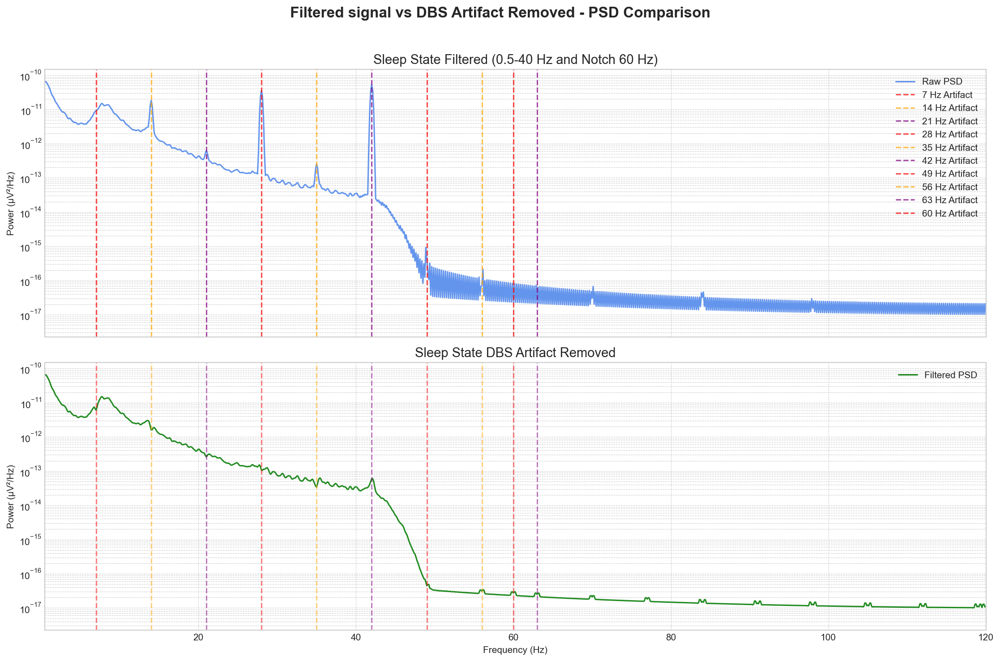

In [93]:
psd_plot_dbs_removed = plot_psd_comparison(
    freqs_up=psd_filt_sleep_freqs,
    psd_up=psd_filt_sleep[filtered_sleep.ch_names.index('Cz')],
    freqs_down=psd_dbs_removed_freqs2,
    psd_down=psd_dbs_removed2[filtered_dbs_removed_sleep.ch_names.index('Cz')],
    channel_name='Cz',
    fmin=0.5,
    fmax=120.0,
    title='Filtered signal vs DBS Artifact Removed - PSD Comparison',
    subtitle_up='Sleep State Filtered (0.5-40 Hz and Notch 60 Hz)',
    subtitle_down='Sleep State DBS Artifact Removed',
    artifact_freqs=artifact_freqs
)

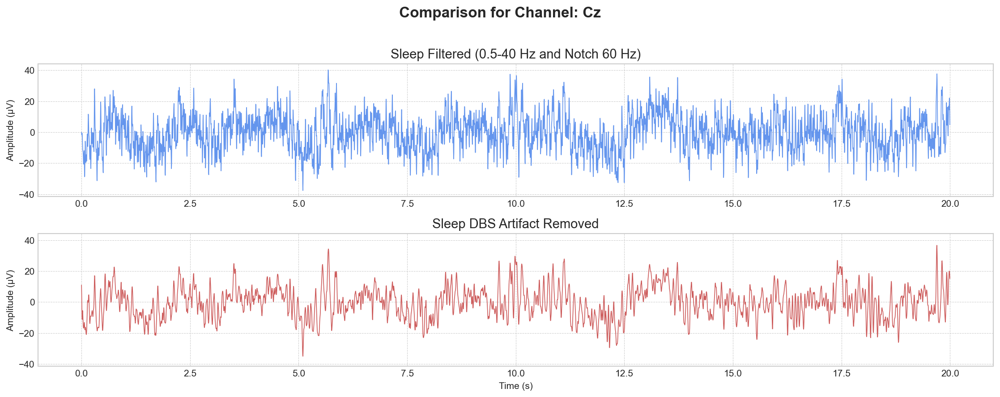

In [94]:
# plot time domain comparsion before and after DBS artifact removal
fig_xu7_sleep_dbs_removed = plot_channel_comparison(raw1=filtered_sleep, start1=0,
                                                    raw2=filtered_dbs_removed_sleep, start2=0,
                                                    channel_name='Cz',
                                                    duration=20.0,
                                                    label1='Sleep Filtered (0.5-40 Hz and Notch 60 Hz)',
                                                    label2='Sleep DBS Artifact Removed',
                                                    figsize=(15, 6))

Using matplotlib as 2D backend.


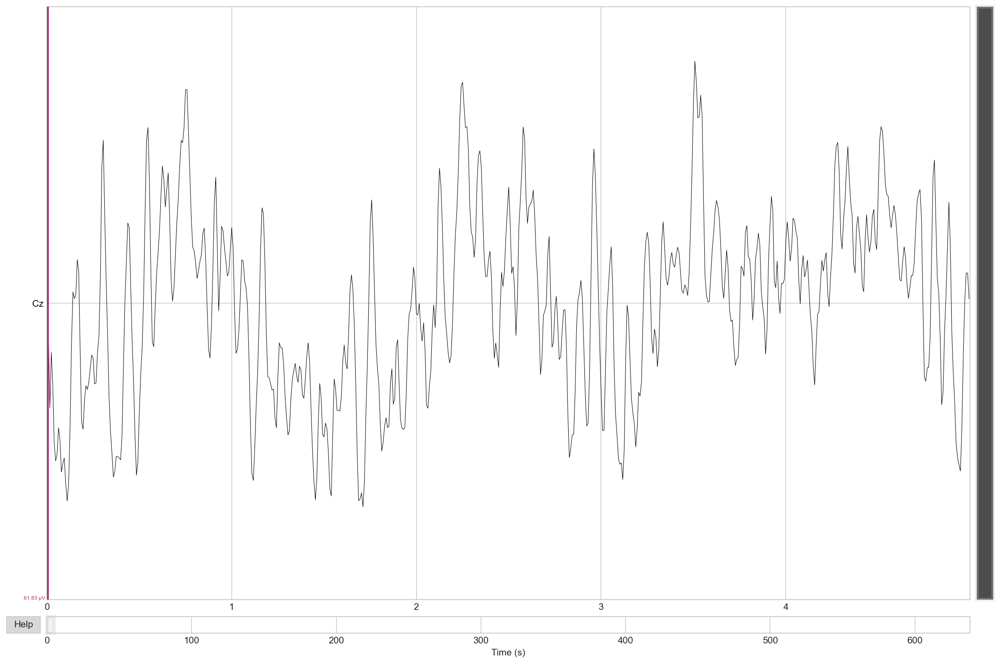

In [95]:
fig_xu7_sleep_dbs_removed = plot_timeseries(filtered_dbs_removed_sleep,
                                            picks=['Cz'],
                                            start=0,
                                            duration=5.0)

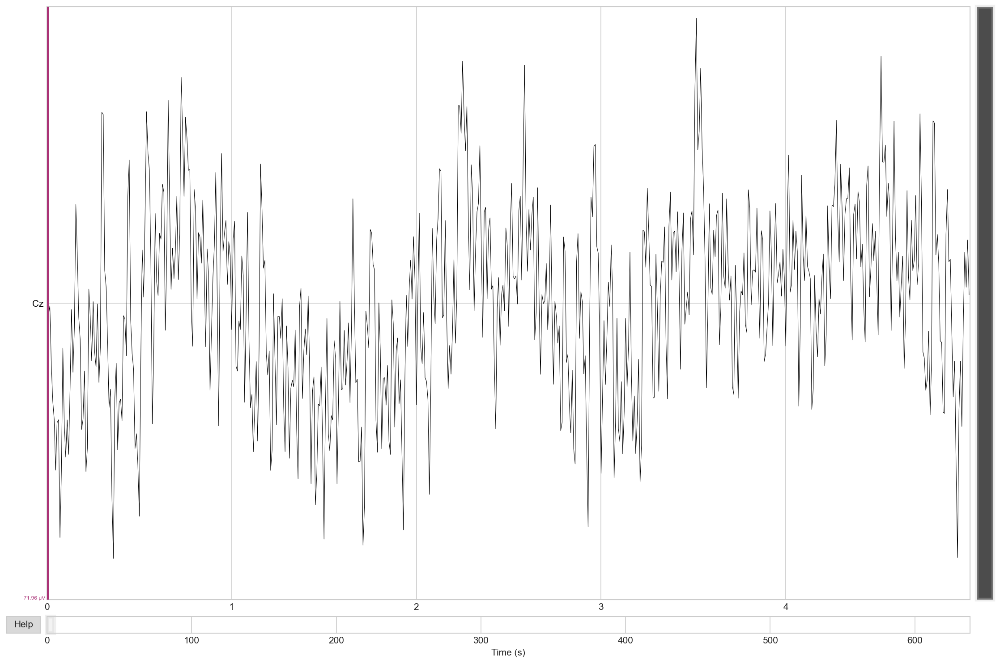

In [96]:
fig_xu7_sleep_filt = plot_timeseries(filtered_sleep,
                                     picks=['Cz'],
                                     start=0,
                                     duration=5.0)

In [97]:
eeg_channels = [ch for ch in filtered_dbs_removed_sleep.ch_names if filtered_dbs_removed_sleep.get_channel_types([ch])[0] == 'eeg']

In [98]:
df_band_powers_sleep = calculate_band_powers(
    psd=psd_dbs_removed2,
    freqs=psd_dbs_removed_freqs2,
    ch_names=eeg_channels
)

In [99]:
band_powers_dict_sleep = {band: df_band_powers_sleep[band].values for band in df_band_powers_sleep.columns}

Found 22 channels with standard positions for plotting.
Saving figure to xu_7dbs_sleep_band_powers_topomaps.png...


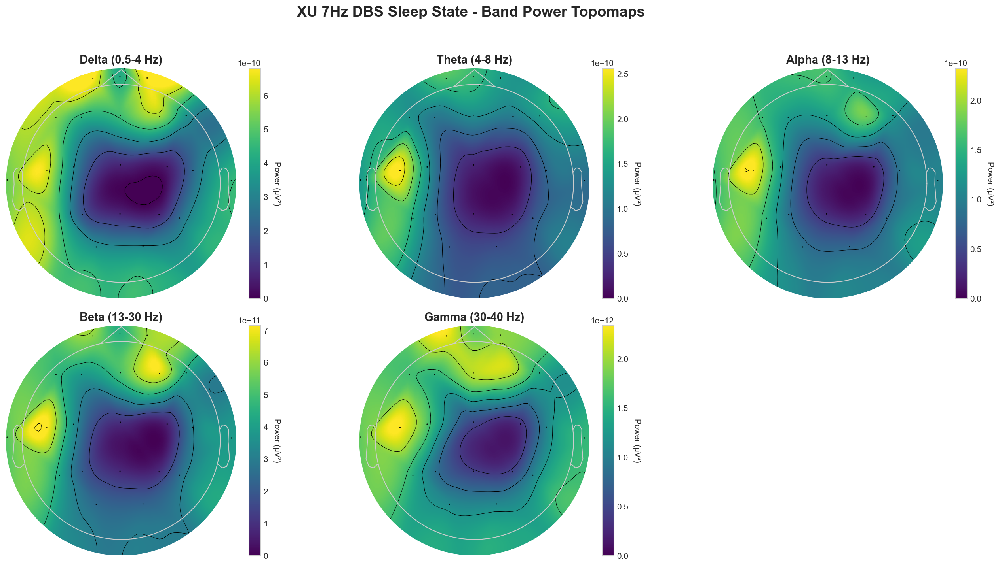

In [100]:
df_band_powers_sleep = plot_band_power_topomaps(
    raw_object=filtered_dbs_removed_sleep,
    band_powers=band_powers_dict_sleep,
    suptitle="XU 7Hz DBS Sleep State - Band Power Topomaps",
    save_path="xu_7dbs_sleep_band_powers_topomaps.png"
)

### Plotting comparison methods

In [101]:
# ch_idx = filtered_awake.ch_names.index('Cz')  # already defined in your code
# save_psd_raw_vs_filtered(psd_base_sleep_freqs, psd_base_awake, psd_filt_awake_freqs, psd_filt_awake, ch_idx,
#                          channel_name='Cz', fname='psd_raw_vs_filtered_Cz.png', max_freq=70)

# # Use the common frequency vector psd_base_sleep_freqs for comparison plotting
# save_psd_method_comparison(psd_base_sleep_freqs, psd_base_sleep, psd_zap, psd_spec, psd_hampel_freq, psd_hampel_time,
#                            ch_idx, channel_name='Cz', fname='psd_method_comparison_Cz.png')

### ICA blink removal

In [102]:
filtered_dbs_removed_sleep_ica = filtered_dbs_removed_sleep.copy()
filtered_dbs_removed_sleep_ica.drop_channels(['T1', 'T2', 'Fpz'])

<RawEDF | XUSLEEP7.EDF, 43 x 163328 (638.0 s), ~53.6 MiB, data loaded>

In [103]:
filtered_dbs_removed_sleep_ica.filter(l_freq=1.0, h_freq=None, fir_design='firwin')

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 845 samples (3.301 s)



<RawEDF | XUSLEEP7.EDF, 43 x 163328 (638.0 s), ~53.6 MiB, data loaded>

In [104]:
eog_evoked = mne.preprocessing.create_eog_epochs(filtered_dbs_removed_sleep_ica, ch_name=['Fp1', 'Fp2']).average()

Using EOG channels: Fp1, Fp2
EOG channel index for this subject is: [ 0 11]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Selecting channel Fp1 for blink detection
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2560 samples (10.000 s)

Now detecting blinks and generating corresponding events
Found 765 significant peaks
Number of EOG events detected: 765
Not setting metadata
765 matching events found
No baseline correction applied
Using data from preloaded Raw for 765 events and 257 original time points ...
1 bad epochs dropped


In [105]:
eog_evoked.apply_baseline(baseline=(None, -0.2))

Applying baseline correction (mode: mean)


<Evoked | '998' (average, N=764), -0.5 – 0.5 s, baseline -0.5 – -0.2 s, 21 ch, ~78 KiB>

No projector specified for this dataset. Please consider the method self.add_proj.


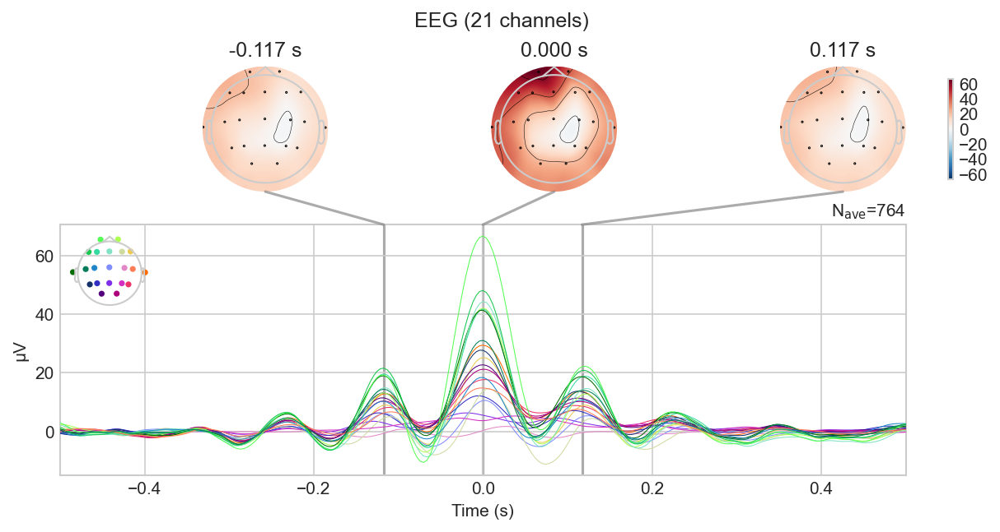

In [106]:
fig =eog_evoked.plot_joint()

In [107]:
ica_sleep = mne.preprocessing.ICA(n_components=15, random_state=97, max_iter='auto', verbose=False)
ica_sleep.fit(filtered_dbs_removed_sleep_ica, picks='eeg')

Fitting ICA to data using 21 channels (please be patient, this may take a while)
Selecting by number: 15 components
Fitting ICA took 2.2s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,42 iterations on raw data (163328 samples)
ICA components,15
Available PCA components,21
Channel types,eeg
ICA components marked for exclusion,—


In [108]:
explained_var_ratio = ica_sleep.get_explained_variance_ratio(filtered_dbs_removed_sleep_ica)
ratio_percent =  round(100 * explained_var_ratio["eeg"])
print(f"Explained variance ratio by ICA components (in %): {ratio_percent}")

Explained variance ratio by ICA components (in %): 99


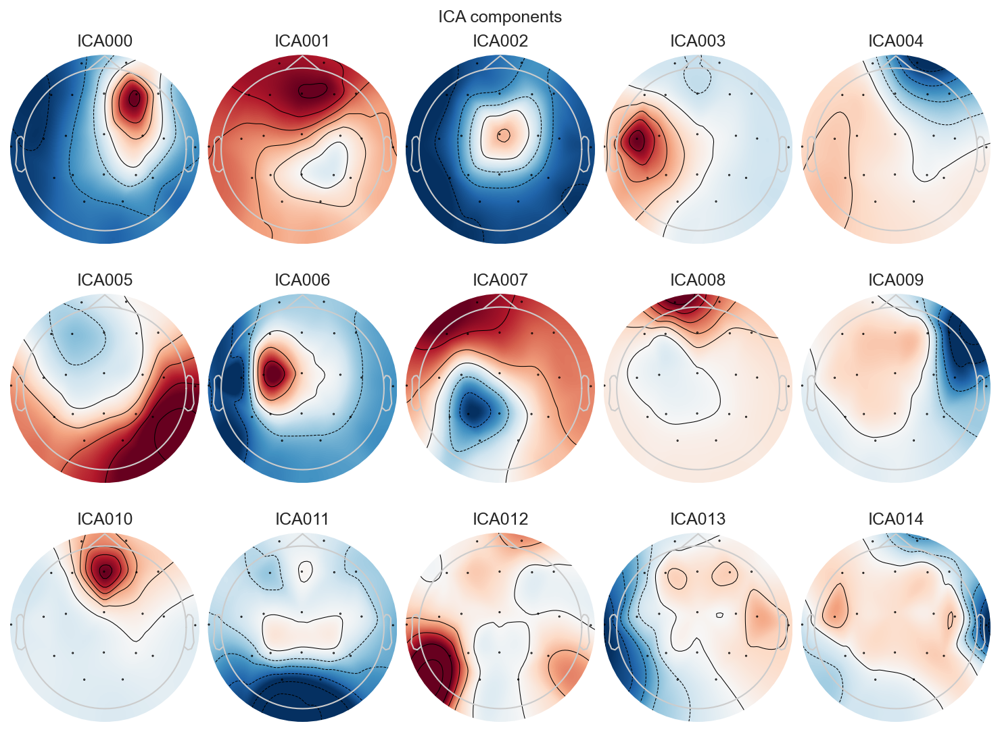

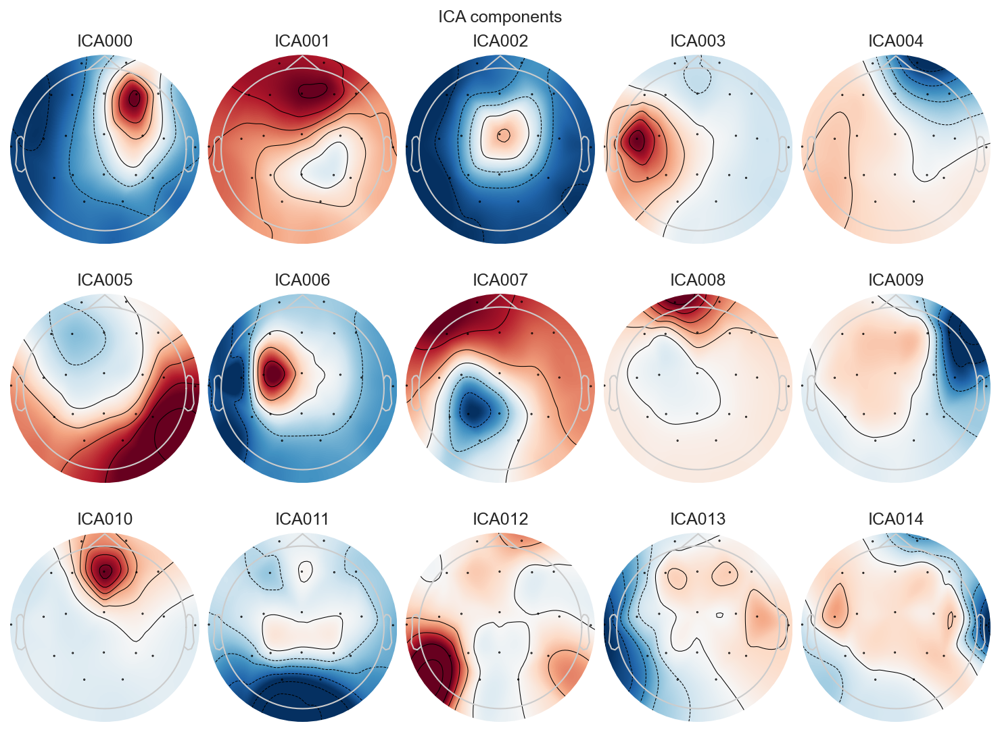

In [109]:
ica_sleep.plot_components()

Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 3 ICA components
    Projecting back using 21 PCA components


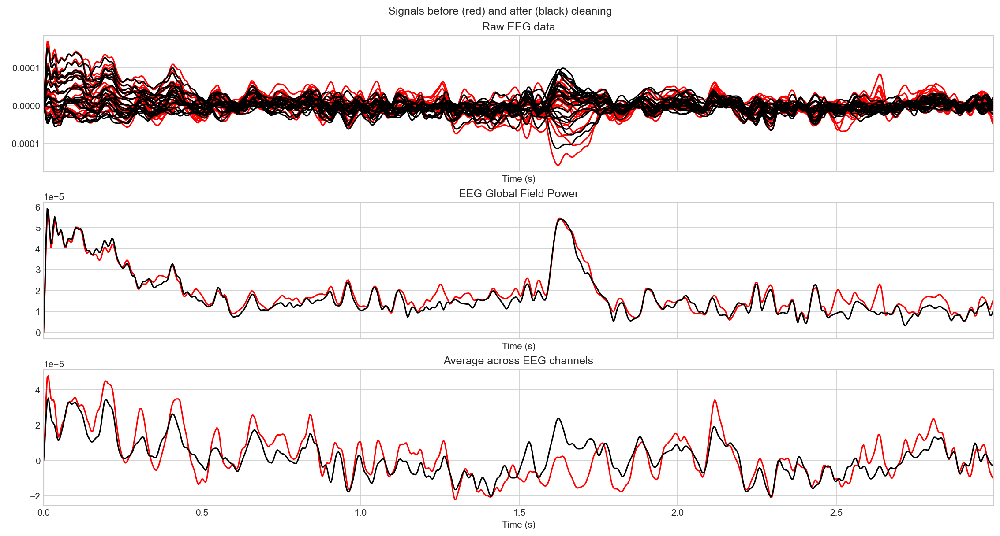

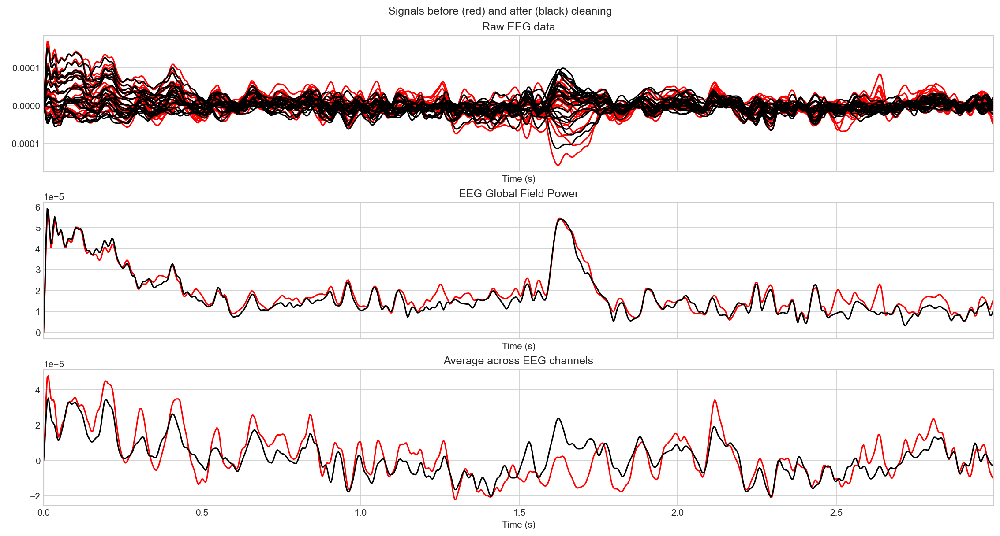

In [110]:
ica_sleep.plot_overlay(filtered_dbs_removed_sleep_ica, exclude=[1,8,10], picks='eeg')

Creating RawArray with float64 data, n_channels=19, n_times=163328
    Range : 0 ... 163327 =      0.000 ...   637.996 secs
Ready.


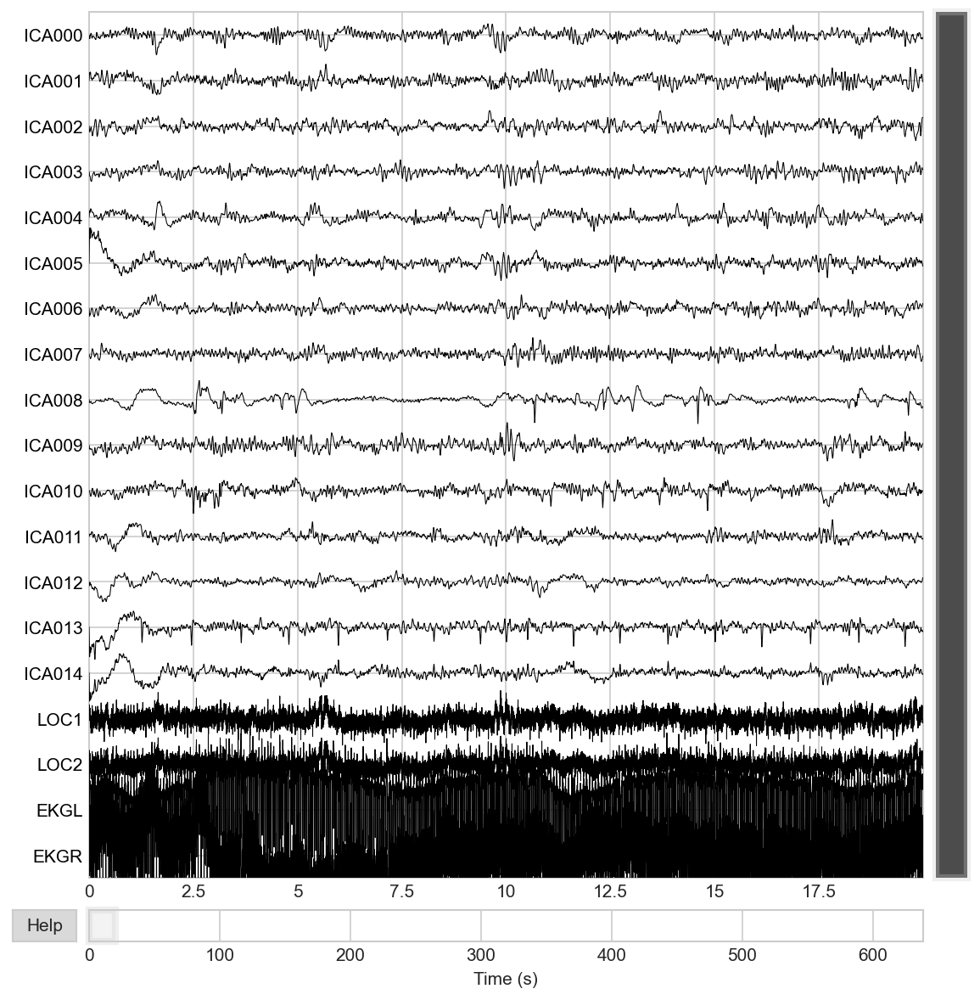

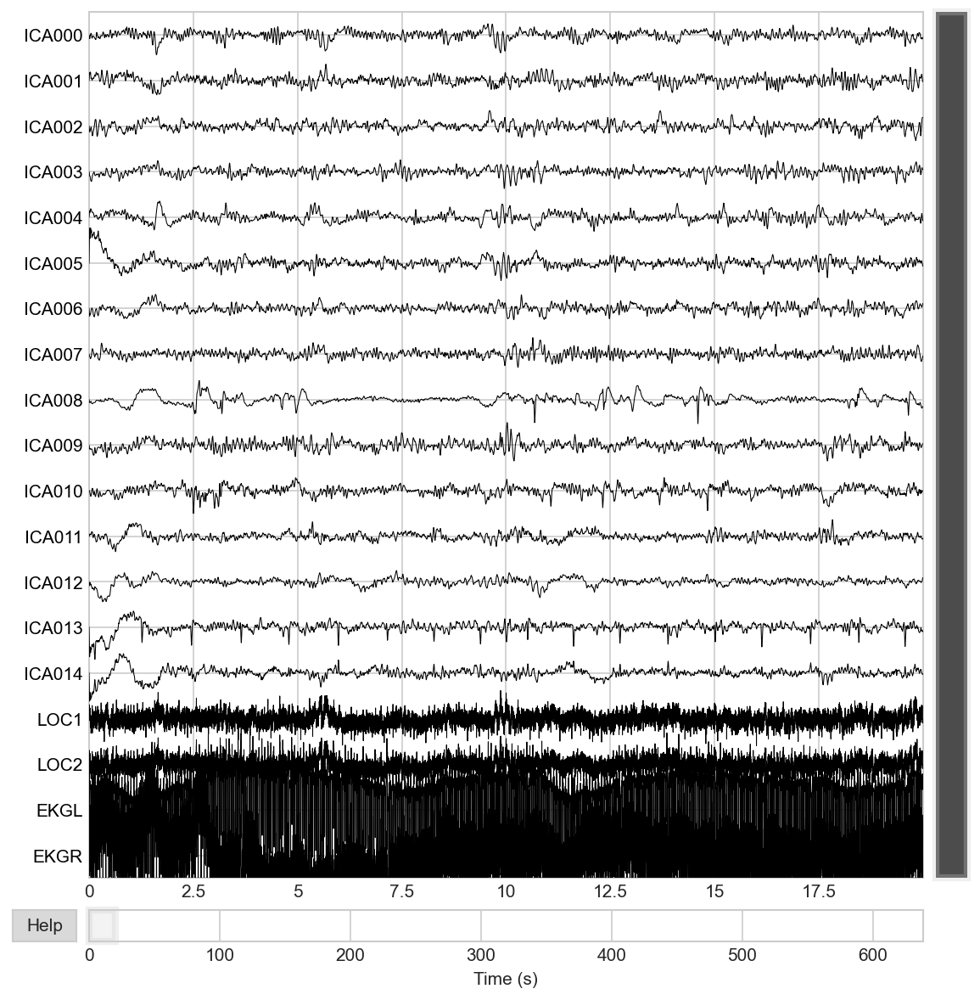

In [111]:
ica_sleep.plot_sources(filtered_dbs_removed_sleep_ica, show_scrollbars=True)

In [112]:
# bipolar montage for EEG channels raw time for every component possible
# very hard to say if it is EOG or not

## Comparison of DBS Artifact Removal Methods

We will compare three methods to reduce Deep Brain Stimulation (DBS) frequency artifacts:
1. **Zapline Algorithm**: Uses spatial filtering to remove line noise.
2. **Notch Filter with Spectrum Fitting**: Removes specific frequencies by fitting the spectrum.
3. **Frequency-Domain Hampel Filter**: Detects and removes spectral peaks (outliers) in the frequency domain.

In [113]:
def apply_freq_domain_hampel(raw, window_size=101, n_sigmas=3):
    """
    Applies a Hampel filter in the frequency domain to remove spectral peaks (artifacts).
    
    Parameters
    ----------
    raw : mne.io.Raw
        The MNE Raw object.
    window_size : int
        The size of the sliding window for the Hampel filter (in frequency bins).
    n_sigmas : float
        The number of standard deviations (estimated by MAD) to use as a threshold.
        
    Returns
    -------
    mne.io.Raw
        The filtered MNE Raw object.
    """
    raw_hampel = raw.copy()
    data = raw_hampel.get_data()
    n_channels, n_samples = data.shape
    
    print(f"Applying Frequency Domain Hampel Filter (window={window_size}, sigma={n_sigmas})...")
    
    for ch_idx in range(n_channels):
        channel_data = data[ch_idx, :]
        
        # 1. FFT (using rfft for real-valued signals)
        fft_coeffs = np.fft.rfft(channel_data)
        magnitude = np.abs(fft_coeffs)
        phase = np.angle(fft_coeffs)
        
        # 2. Hampel Filter on Magnitude
        # Convert to pandas series for efficient rolling window operations
        mag_series = pd.Series(magnitude)
        
        # Calculate rolling median
        rolling_median = mag_series.rolling(window=window_size, center=True).median()
        
        # Calculate MAD (Median Absolute Deviation)
        # MAD = median(|x - median(x)|)
        # We use a lambda for the rolling MAD calculation
        rolling_mad = mag_series.rolling(window=window_size, center=True).apply(
            lambda x: np.median(np.abs(x - np.median(x))), raw=True
        )
        
        # Handle NaN at edges (fill with nearest valid value)
        rolling_median = rolling_median.bfill().ffill()
        rolling_mad = rolling_mad.bfill().ffill()
        
        # Threshold (k=1.4826 makes MAD consistent with std dev for normal distribution)
        threshold = n_sigmas * 1.4826 * rolling_mad
        
        # Identify outliers
        difference = np.abs(magnitude - rolling_median)
        outlier_mask = difference > threshold
        
        # Replace outliers with local median
        magnitude_filtered = magnitude.copy()
        magnitude_filtered[outlier_mask] = rolling_median[outlier_mask]
        
        # 3. Inverse FFT
        # Reconstruct complex coefficients
        fft_filtered = magnitude_filtered * np.exp(1j * phase)
        data[ch_idx, :] = np.fft.irfft(fft_filtered, n=n_samples)
        
    raw_hampel._data = data
    print("Hampel filtering complete.")
    return raw_hampel

In [114]:
def apply_time_domain_hampel(raw, window_size=101, n_sigmas=3):
    """
    Applies a traditional Hampel filter in the Time Domain to remove outliers.
    
    Parameters
    ----------
    raw : mne.io.Raw
        The MNE Raw object.
    window_size : int
        The size of the sliding window (in samples).
    n_sigmas : float
        The number of standard deviations to use as a threshold.
        
    Returns
    -------
    mne.io.Raw
        The filtered MNE Raw object.
    """
    raw_hampel = raw.copy()
    data = raw_hampel.get_data()
    n_channels, n_samples = data.shape
    
    print(f"Applying Time Domain Hampel Filter (window={window_size}, sigma={n_sigmas})...")
    
    for ch_idx in range(n_channels):
        channel_data = data[ch_idx, :]
        
        # Convert to pandas series for efficient rolling window operations
        series = pd.Series(channel_data)
        
        # Calculate rolling median
        rolling_median = series.rolling(window=window_size, center=True).median()
        
        # Calculate MAD
        rolling_mad = series.rolling(window=window_size, center=True).apply(
            lambda x: np.median(np.abs(x - np.median(x))), raw=True
        )
        
        # Handle NaN at edges
        rolling_median = rolling_median.bfill().ffill()
        rolling_mad = rolling_mad.bfill().ffill()
        
        # Threshold
        threshold = n_sigmas * 1.4826 * rolling_mad
        
        # Identify outliers
        difference = np.abs(channel_data - rolling_median)
        outlier_mask = difference > threshold
        
        # Replace outliers
        channel_data_filtered = channel_data.copy()
        channel_data_filtered[outlier_mask] = rolling_median[outlier_mask]
        
        data[ch_idx, :] = channel_data_filtered
        
    raw_hampel._data = data
    print("Time-domain Hampel filtering complete.")
    return raw_hampel

In [115]:
# --- Prepare Data for Comparison ---
# We use 'filtered_sleep' as the baseline (Bandpass 0.5-40Hz + Notch 60Hz applied)

print("Running comparison on 'filtered_sleep' data...")

# Define Harmonics for all methods
sfreq = filtered_sleep.info['sfreq']
dbs_harmonics = np.arange(dbs_freq, sfreq / 2, dbs_freq)
powerline_harmonics = np.arange(powerline_freq, sfreq / 2, powerline_freq)
freqs_to_remove = np.union1d(dbs_harmonics, powerline_harmonics)

# 1. Zapline (Using ALL harmonics)
print("\n--- Method 1: Zapline (All Harmonics) ---")
# Note: Zapline might be aggressive if we pass too many frequencies. 
# We'll pass the DBS harmonics.
raw_zapline, _scores, _details, _freqs = apply_zapline_to_raw(
    filtered_sleep.copy(), 
    line_freqs=dbs_harmonics, # Changed from [dbs_freq] to dbs_harmonics
    verbose=True
)

# 2. Spectrum Fit (Notch)
print("\n--- Method 2: Spectrum Fit ---")
raw_spectrum_fit = filtered_sleep.copy().notch_filter(
    freqs=freqs_to_remove,
    method='spectrum_fit',
    n_jobs=1,
    verbose=True
)

# 3. Frequency-Domain Hampel
print("\n--- Method 3: Freq-Domain Hampel ---")
# Window size of 101 bins (~1.6Hz window)
raw_hampel_freq = apply_freq_domain_hampel(filtered_sleep.copy(), window_size=101, n_sigmas=3)

# 4. Time-Domain Hampel (Traditional)
print("\n--- Method 4: Time-Domain Hampel ---")
# Window size: 500Hz sampling. 
# DBS is 7Hz (period ~142ms ~71 samples).
# We need a window larger than the period to estimate the median correctly?
# Or smaller to catch the "spikes"? 
# Actually, DBS is a continuous wave, not spikes. Time-domain Hampel might not work well,
# but we will test it. A window of ~0.2s (100 samples) seems reasonable.
raw_hampel_time = apply_time_domain_hampel(filtered_sleep.copy(), window_size=101, n_sigmas=3)

Running comparison on 'filtered_sleep' data...

--- Method 1: Zapline (All Harmonics) ---
Data set is short. Adjusted window size for whole-spectrum calculation to 79.0 seconds.


KeyboardInterrupt: 

Effective window size : 8.000 (s)
Effective window size : 8.000 (s)
Effective window size : 8.000 (s)
Effective window size : 8.000 (s)
Effective window size : 8.000 (s)
Effective window size : 8.000 (s)
Effective window size : 8.000 (s)
Effective window size : 8.000 (s)
Effective window size : 8.000 (s)


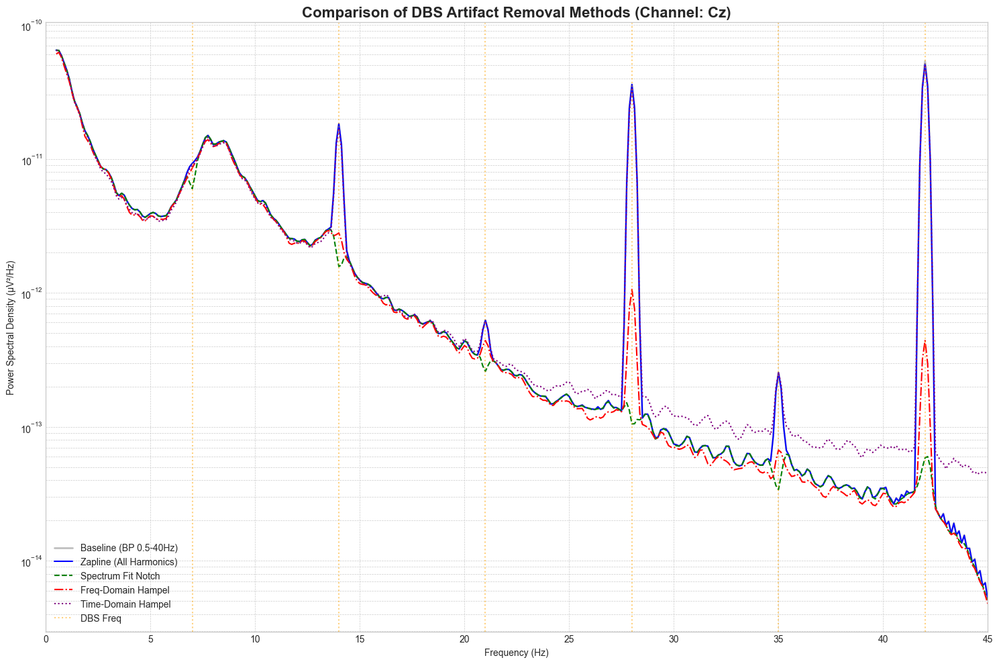

In [ ]:
# --- Calculate PSDs for Comparison ---
fmax_plot = 45.0 

# 1. Baseline
psd_base_freqs, psd_base = get_psd(filtered_sleep, fmax=fmax_plot)

# 2. Zapline
psd_zap_freqs, psd_zap = get_psd(raw_zapline, fmax=fmax_plot)

# 3. Spectrum Fit
psd_spec_freqs, psd_spec = get_psd(raw_spectrum_fit, fmax=fmax_plot)

# 4. Freq-Domain Hampel
psd_hampel_freq_freqs, psd_hampel_freq = get_psd(raw_hampel_freq, fmax=fmax_plot)

# 5. Time-Domain Hampel
psd_hampel_time_freqs, psd_hampel_time = get_psd(raw_hampel_time, fmax=fmax_plot)

# --- Plotting ---
channel_to_plot = 'Cz' 
ch_idx = filtered_sleep.ch_names.index(channel_to_plot)

plt.figure(figsize=(15, 10))
plt.title(f'Comparison of DBS Artifact Removal Methods (Channel: {channel_to_plot})', fontsize=16, fontweight='bold')

# Plot Baseline
plt.semilogy(psd_base_freqs, psd_base[ch_idx], label='Baseline (BP 0.5-40Hz)', color='gray', alpha=0.5, linewidth=2)

# Plot Methods
plt.semilogy(psd_zap_freqs, psd_zap[ch_idx], label='Zapline (All Harmonics)', color='blue', linewidth=1.5)
plt.semilogy(psd_spec_freqs, psd_spec[ch_idx], label='Spectrum Fit Notch', color='green', linewidth=1.5, linestyle='--')
plt.semilogy(psd_hampel_freq_freqs, psd_hampel_freq[ch_idx], label='Freq-Domain Hampel', color='red', linewidth=1.5, linestyle='-.')
plt.semilogy(psd_hampel_time_freqs, psd_hampel_time[ch_idx], label='Time-Domain Hampel', color='purple', linewidth=1.5, linestyle=':')

# Mark DBS Frequencies
for i, freq in enumerate(dbs_harmonics):
    if freq > fmax_plot: break
    plt.axvline(freq, color='orange', linestyle=':', alpha=0.5, label='DBS Freq' if i == 0 else None)

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power Spectral Density (µV²/Hz)')
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.xlim(0, fmax_plot)
plt.tight_layout()
plt.show()

Quantitative Comparison of DBS Artifact Removal Methods (Channel Cz):


,Method,Artifact Attenuation (dB),Signal Preservation (Broadband) %,Alpha Band Preservation %,SNR Improvement (dB)
0,Zapline,0.08,99.95,99.86,0.08
1,Spectrum Fit,8.45,99.75,100.00,8.44
2,Freq-Domain Hampel,7.44,95.52,96.46,7.24
3,Time-Domain Hampel,0.26,97.75,96.23,0.16


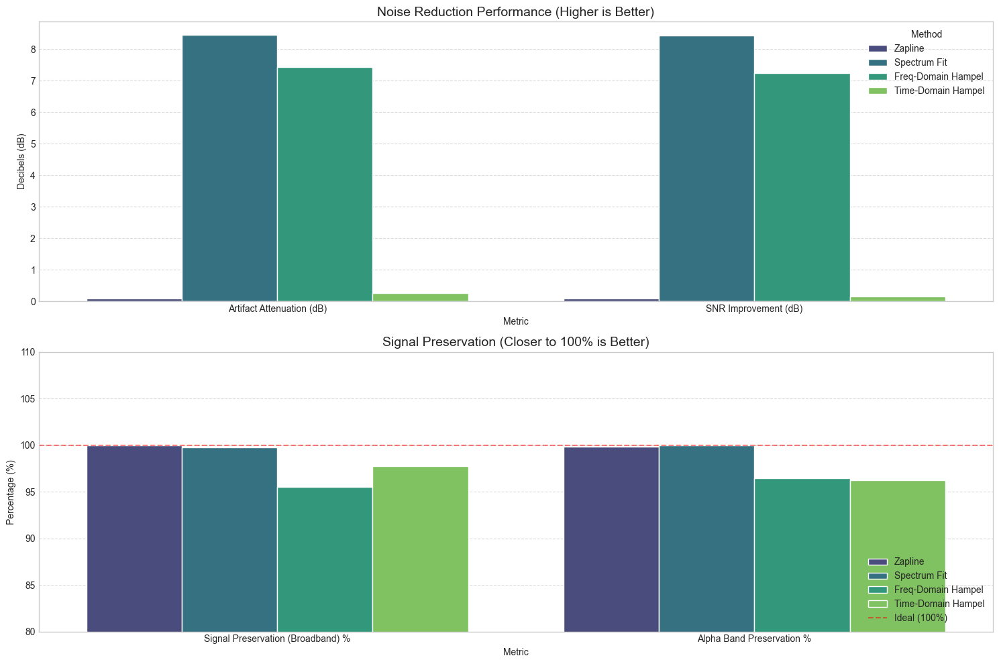

In [ ]:
def calculate_quality_metrics(psd_raw, psd_clean, freqs, dbs_freq, method_name):
    """
    Calculates quantitative metrics for artifact removal performance.
    """
    # --- Define Frequency Bands ---
    harmonics = np.arange(dbs_freq, freqs[-1], dbs_freq)
    artifact_indices = []
    for h in harmonics:
        idx = np.where((freqs >= h - 0.25) & (freqs <= h + 0.25))[0]
        artifact_indices.extend(idx)
    artifact_indices = np.unique(artifact_indices)
    
    valid_mask = (freqs >= 0.5) & (freqs <= 45.0)
    all_signal_indices = np.where(valid_mask)[0]
    clean_signal_indices = np.setdiff1d(all_signal_indices, artifact_indices)
    
    alpha_indices = np.where((freqs >= 8.0) & (freqs <= 12.0))[0]

    df = freqs[1] - freqs[0]
    def get_power(psd_data, indices):
        if len(indices) == 0: return 1e-10
        return np.sum(psd_data[indices]) * df

    p_art_raw = get_power(psd_raw, artifact_indices)
    p_art_clean = get_power(psd_clean, artifact_indices)
    
    p_sig_raw = get_power(psd_raw, clean_signal_indices)
    p_sig_clean = get_power(psd_clean, clean_signal_indices)
    
    p_alpha_raw = get_power(psd_raw, alpha_indices)
    p_alpha_clean = get_power(psd_clean, alpha_indices)

    metrics = {
        'Method': method_name,
        'Artifact Attenuation (dB)': 10 * np.log10(p_art_raw / p_art_clean),
        'Signal Preservation (Broadband) %': (p_sig_clean / p_sig_raw) * 100,
        'Alpha Band Preservation %': (p_alpha_clean / p_alpha_raw) * 100,
        'SNR Improvement (dB)': 10 * np.log10((p_sig_clean / p_art_clean) / (p_sig_raw / p_art_raw))
    }
    return metrics

# --- Run Analysis ---
ch_idx = filtered_sleep.ch_names.index('Cz')

results = []

# 1. Zapline
results.append(calculate_quality_metrics(
    psd_base[ch_idx], psd_zap[ch_idx], psd_base_freqs, dbs_freq, 'Zapline'
))

# 2. Spectrum Fit
results.append(calculate_quality_metrics(
    psd_base[ch_idx], psd_spec[ch_idx], psd_base_freqs, dbs_freq, 'Spectrum Fit'
))

# 3. Freq-Domain Hampel
results.append(calculate_quality_metrics(
    psd_base[ch_idx], psd_hampel_freq[ch_idx], psd_base_freqs, dbs_freq, 'Freq-Domain Hampel'
))

# 4. Time-Domain Hampel
results.append(calculate_quality_metrics(
    psd_base[ch_idx], psd_hampel_time[ch_idx], psd_base_freqs, dbs_freq, 'Time-Domain Hampel'
))

# Create DataFrame
df_results = pd.DataFrame(results)

# Display
print("Quantitative Comparison of DBS Artifact Removal Methods (Channel Cz):")
display(df_results.round(2))

# --- Plotting Metrics ---
df_melted = df_results.melt(id_vars="Method", var_name="Metric", value_name="Value")

plt.figure(figsize=(15, 10))

plt.subplot(2, 1, 1)
metrics_db = ['Artifact Attenuation (dB)', 'SNR Improvement (dB)']
sns.barplot(data=df_melted[df_melted['Metric'].isin(metrics_db)], 
            x='Metric', y='Value', hue='Method', palette='viridis')
plt.title('Noise Reduction Performance (Higher is Better)', fontsize=14)
plt.ylabel('Decibels (dB)')
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.subplot(2, 1, 2)
metrics_pct = ['Signal Preservation (Broadband) %', 'Alpha Band Preservation %']
sns.barplot(data=df_melted[df_melted['Metric'].isin(metrics_pct)], 
            x='Metric', y='Value', hue='Method', palette='viridis')
plt.title('Signal Preservation (Closer to 100% is Better)', fontsize=14)
plt.ylabel('Percentage (%)')
plt.axhline(100, color='red', linestyle='--', alpha=0.5, label='Ideal (100%)')
plt.ylim(80, 110)
plt.legend(loc='lower right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

## ICA Quality Evaluation

We will now evaluate the quality of the ICA cleaning by:
1.  **Visualizing Excluded Components**: Checking their topomaps, time courses, and PSDs to confirm they are artifacts (e.g., blinks, muscle noise).
2.  **Time Domain Comparison**: Comparing the signal before and after ICA cleaning on specific channels (e.g., Fp1 for blinks).
3.  **Bipolar Montage Plot**: Viewing the cleaned data in a standard clinical montage (Double Banana) to assess overall signal quality and identify any remaining artifacts.

Applying ICA cleaning, excluding components: [1, 8, 10]
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 3 ICA components
    Transforming to ICA space (15 components)
    Zeroing out 3 ICA components
    Projecting back using 21 PCA components
    Projecting back using 21 PCA components
Properties of excluded components (Bilateral Topomap Referenced Plot):
    Using multitaper spectrum estimation with 7 DPSS windows
Properties of excluded components (Bilateral Topomap Referenced Plot):
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
319 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
319 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
319 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
319 matching events found
No baseline correction applied
0 proj

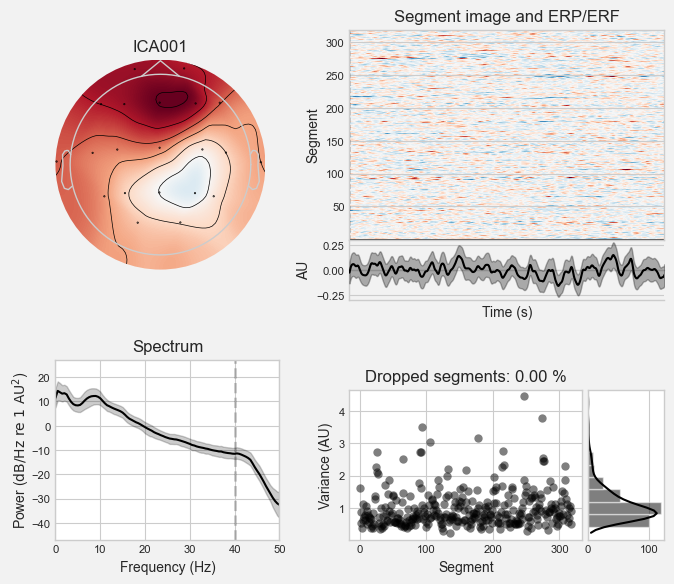

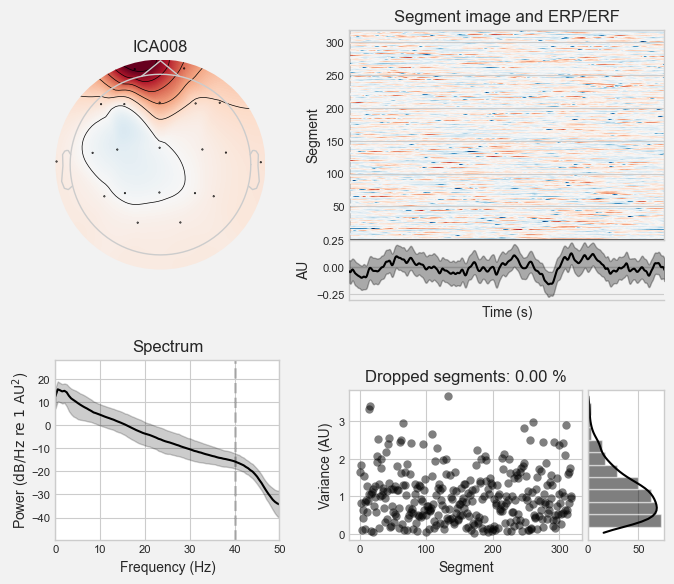

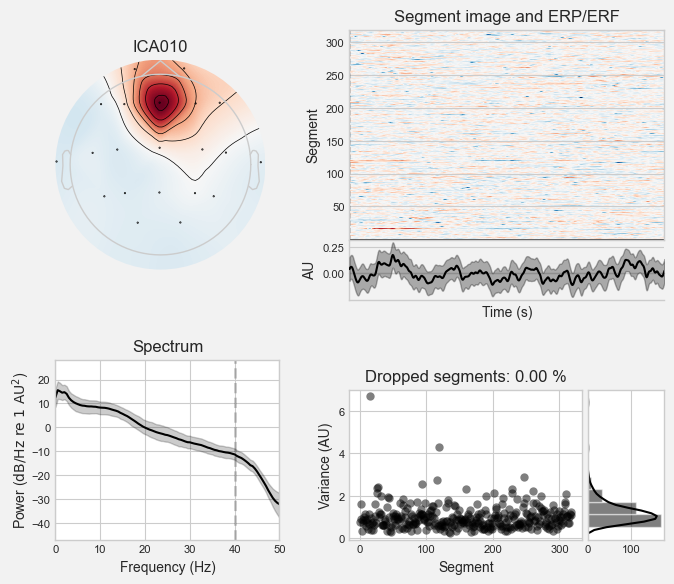

Overlay of Original vs Cleaned Signal (Time Domain):
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 3 ICA components
    Projecting back using 21 PCA components
    Transforming to ICA space (15 components)
    Zeroing out 3 ICA components
    Projecting back using 21 PCA components


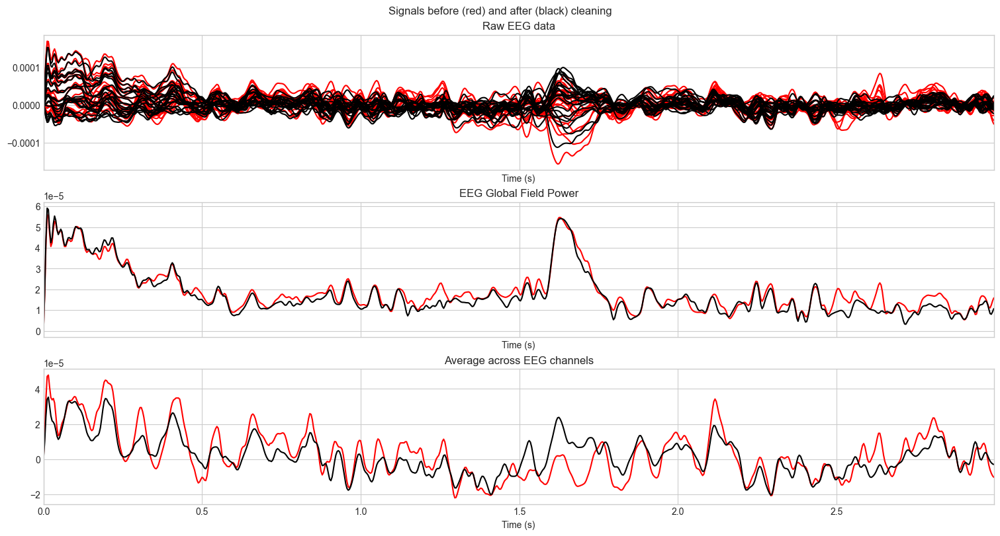

Channel-specific comparison (Frontal Channel Fp1):


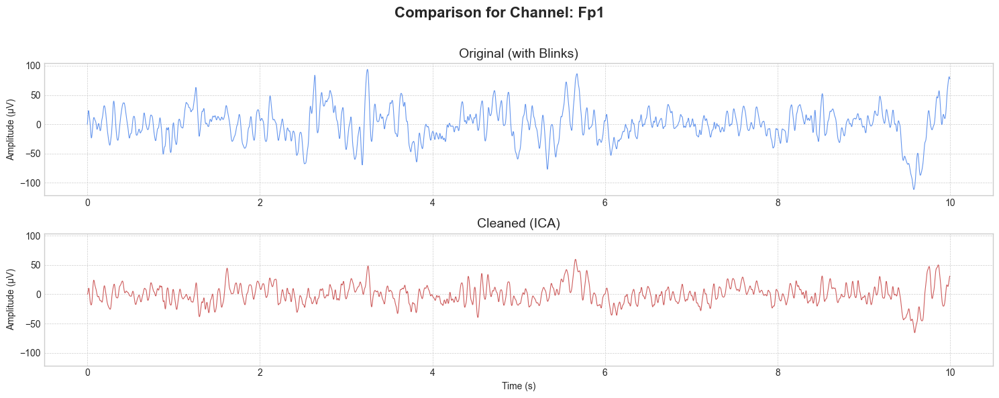

Bipolar Montage of Cleaned Data:


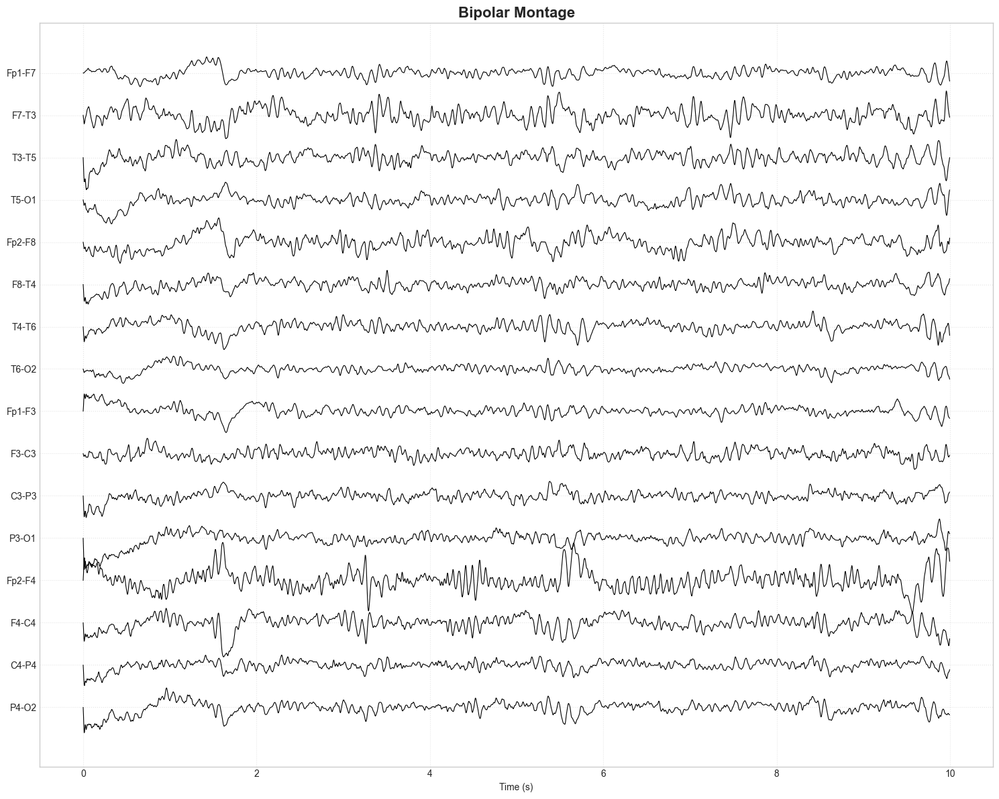

In [ ]:
# Define artifacts to exclude (based on previous analysis/visual inspection)
# Assuming components 1, 8, and 10 were identified as artifacts in the previous steps
ica_exclude = [1, 8, 10]
ica_sleep.exclude = ica_exclude

print(f"Applying ICA cleaning, excluding components: {ica_exclude}")

# 1. Apply ICA
raw_cleaned = filtered_dbs_removed_sleep_ica.copy()
ica_sleep.apply(raw_cleaned)

# 2. Detailed Component Properties (Topomap + Time Course + PSD)
# This helps evaluate if the excluded components are indeed artifacts
print("Properties of excluded components (Bilateral Topomap Referenced Plot):")
ica_sleep.plot_properties(filtered_dbs_removed_sleep_ica, picks=ica_exclude)

# 3. Time Domain Evaluation: Overlay (Butterfly Plot)
# Shows the Global Field Power (GFP) or overlay of all channels to see reduction in noise
print("Overlay of Original vs Cleaned Signal (Time Domain):")
ica_sleep.plot_overlay(filtered_dbs_removed_sleep_ica, exclude=ica_exclude, picks='eeg')

# 4. Channel-specific Time Domain Comparison
# Zoom in on frontal channels where blinks are most prominent
print("Channel-specific comparison (Frontal Channel Fp1):")
# Using the previously defined plot_channel_comparison function
plot_channel_comparison(filtered_dbs_removed_sleep_ica, start1=0, 
                        raw2=raw_cleaned, start2=0, 
                        channel_name='Fp1', 
                        duration=10.0, 
                        label1='Original (with Blinks)', 
                        label2='Cleaned (ICA)',
                        figsize=(15, 6))

# 5. Bipolar Montage Plot (Clinical Quality Check)
def plot_bipolar_montage(raw, start=0, duration=10, title="Bipolar Montage"):
    """
    Plots the EEG data in a standard longitudinal bipolar (Double Banana) montage.
    """
    # Standard Double Banana Montage pairs
    bipolar_pairs = [
        ('Fp1', 'F7'), ('F7', 'T3'), ('T3', 'T5'), ('T5', 'O1'), # Left Temporal
        ('Fp2', 'F8'), ('F8', 'T4'), ('T4', 'T6'), ('T6', 'O2'), # Right Temporal
        ('Fp1', 'F3'), ('F3', 'C3'), ('C3', 'P3'), ('P3', 'O1'), # Left Parasagittal
        ('Fp2', 'F4'), ('F4', 'C4'), ('C4', 'P4'), ('P4', 'O2')  # Right Parasagittal
    ]
    
    fig, ax = plt.subplots(figsize=(15, 12))
    offset = 0
    y_ticks = []
    y_labels = []
    
    # Get data for the specified time window
    data, times = raw.get_data(start=int(start*raw.info['sfreq']), 
                               stop=int((start+duration)*raw.info['sfreq']), 
                               return_times=True)
    
    for ch1, ch2 in bipolar_pairs:
        if ch1 in raw.ch_names and ch2 in raw.ch_names:
            idx1 = raw.ch_names.index(ch1)
            idx2 = raw.ch_names.index(ch2)
            
            # Calculate bipolar difference
            diff = (data[idx1] - data[idx2]) * 1e6 # Convert to uV
            
            # Plot with offset
            ax.plot(times, diff + offset, color='k', linewidth=0.8)
            
            y_ticks.append(offset)
            y_labels.append(f"{ch1}-{ch2}")
            
            offset -= 100 # Shift down by 100 uV for next channel
            
    ax.set_yticks(y_ticks)
    ax.set_yticklabels(y_labels)
    ax.set_xlabel("Time (s)")
    ax.set_title(title, fontsize=16, fontweight='bold')
    ax.grid(True, linestyle=':', alpha=0.5)
    
    # Add a scale bar (approximate)
    # ax.plot([times[0], times[0]], [0, 50], color='k', linewidth=2)
    # ax.text(times[0], 25, ' 50 µV', verticalalignment='center')
    
    plt.tight_layout()
    plt.show()

print("Bipolar Montage of Cleaned Data:")
plot_bipolar_montage(raw_cleaned, start=0, duration=10)

## Topographic Comparison: Before vs After DBS Removal

We visualize the spatial distribution of power in the DBS frequency bands to see:
1.  **Where the artifact is located** (Before).
2.  **How effectively it is removed** (After).
3.  **Preservation of physiological bands** (e.g., Alpha).

Effective window size : 8.000 (s)
Effective window size : 8.000 (s)
Effective window size : 8.000 (s)


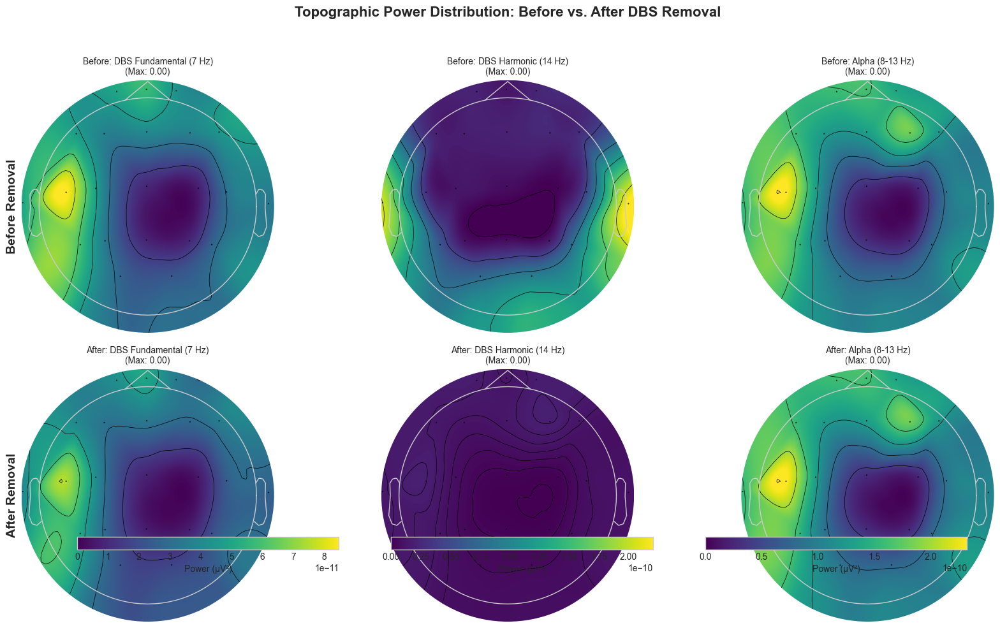

In [ ]:
# Define bands of interest
dbs_bands = {
    f'DBS Fundamental ({dbs_freq} Hz)': (dbs_freq-0.5, dbs_freq+0.5),
    f'DBS Harmonic ({2*dbs_freq} Hz)': (2*dbs_freq-0.5, 2*dbs_freq+0.5),
    'Alpha (8-13 Hz)': (8, 13)
}

# Compute PSDs
# Using fmax=45 to cover the bands of interest
psd_before_freqs, psd_before = get_psd(filtered_sleep, fmax=45.0)
psd_after_freqs, psd_after = get_psd(filtered_dbs_removed_sleep, fmax=45.0)

# Get channel names for EEG
eeg_picks = mne.pick_types(filtered_sleep.info, eeg=True, exclude='bads')
ch_names = [filtered_sleep.ch_names[i] for i in eeg_picks]

# Calculate Band Powers
df_before = calculate_band_powers(psd_before, psd_before_freqs, ch_names, bands=dbs_bands)
df_after = calculate_band_powers(psd_after, psd_after_freqs, ch_names, bands=dbs_bands)

# Plotting
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
plt.suptitle("Topographic Power Distribution: Before vs. After DBS Removal", fontsize=16, fontweight='bold')

# Create info object with montage for plotting
montage = mne.channels.make_standard_montage('standard_1020')
# Filter for channels present in montage to avoid errors
valid_ch_names = [ch for ch in ch_names if ch in montage.ch_names]
info_temp = filtered_sleep.copy().pick(valid_ch_names).set_montage(montage, on_missing='warn').info

# Update DataFrames to only include valid channels
df_before = df_before.loc[valid_ch_names]
df_after = df_after.loc[valid_ch_names]

for i, band in enumerate(dbs_bands.keys()):
    # Common scale
    vmax = max(df_before[band].max(), df_after[band].max())
    
    # Plot Before
    im, _ = mne.viz.plot_topomap(df_before[band].values, info_temp, axes=axes[0, i], show=False,
                         cmap='viridis', vlim=(0, vmax), contours=6)
    axes[0, i].set_title(f"Before: {band}\n(Max: {df_before[band].max():.2f})", fontsize=10)
    
    # Plot After
    im, _ = mne.viz.plot_topomap(df_after[band].values, info_temp, axes=axes[1, i], show=False,
                         cmap='viridis', vlim=(0, vmax), contours=6)
    axes[1, i].set_title(f"After: {band}\n(Max: {df_after[band].max():.2f})", fontsize=10)
    
    # Colorbar for the column
    # We add colorbar to the bottom of the column
    cbar = plt.colorbar(im, ax=axes[:, i], fraction=0.05, pad=0.04, orientation='horizontal')
    cbar.set_label('Power (µV²)')

# Add row labels
axes[0, 0].set_ylabel("Before Removal", fontsize=14, fontweight='bold')
axes[1, 0].set_ylabel("After Removal", fontsize=14, fontweight='bold')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

## ML system

In [ ]:
# %%
from sklearn.ensemble import IsolationForest
from scipy.stats import kurtosis

def extract_sharpness_features(filtered_dbs_removed_sleep, window_size_sec=0.2):
    """
    Extracts features emphasizing 'sharpness' (slope) over raw amplitude.
    """
    # 1. Calculate the first derivative (slope) of the signal
    # This kills slow waves and highlights sharp transitions
    data_diff = np.diff(filtered_dbs_removed_sleep.get_data(), axis=1)
    
    # Create epochs on this DIFFERENTIATED data
    epochs_diff = mne.make_fixed_length_epochs(
        mne.io.RawArray(data_diff, filtered_dbs_removed_sleep.info), 
        duration=window_size_sec, 
        overlap=0.0, 
        verbose=False
    )
    
    # Get the data: (n_windows, n_channels, n_samples)
    X_diff = epochs_diff.get_data(copy=False)
    
    # --- Feature Engineering on the Slope ---
    # Max Slope (Steepness of the spike rising phase)
    feat_max_slope = np.max(np.max(np.abs(X_diff), axis=2), axis=1)
    
    # Kurtosis of the slope (How "outlier-like" is the sharpness?)
    feat_kurt_slope = np.max(kurtosis(X_diff, axis=2), axis=1)
    
    # Line Length (Complexity/High Frequency energy)
    feat_ll = np.max(np.sum(np.abs(np.diff(X_diff, axis=2)), axis=2), axis=1)

    # Stack features
    X = np.column_stack([feat_max_slope, feat_kurt_slope, feat_ll])
    
    return X, epochs_diff

In [130]:
# %%
if len(aligned_events) > 0:
    # Create epochs centered on the NEW aligned events
    # We grab 0.5s before and after to see the context
    spike_epochs = mne.Epochs(filtered_dbs_removed_sleep, aligned_events, tmin=-0.2, tmax=0.2, 
                              baseline=(None, -0.1), preload=True)
    
    # 1. Plot the Average again (Should look sharper now)
    fig_avg = spike_epochs.average().plot(titles="Aligned Average Spike")
    
    # 2. Plot the 'Image' view (Heatmap of all spikes)
    # This helps you see if they are consistent or just noise
    fig_img = spike_epochs.plot_image(combine='mean', title="Heatmap of All Detections")
    
    # 3. Plot 5 random individual spikes to verify with your eyes
    import random
    indices = random.sample(range(len(spike_epochs)), min(5, len(spike_epochs)))
    for idx in indices:
        spike_epochs[idx].plot(n_channels=5, title=f"Individual Detection #{idx}")

NameError: name 'aligned_events' is not defined